In [12]:
import pandas as pd
import os
import numpy as np
from tqdm import tqdm
from google.colab import drive
import warnings
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Lasso

In [4]:
drive.mount('/content/drive')
warnings.filterwarnings("ignore")
factor_path = '/content/drive/MyDrive/Colab Notebooks/Independent project_2023 Summer/FactorData/AllFactors/'

In [32]:
trading_pairs = {'JBF':'3443','QWF':'2388','HCF':'2498','DBF':'2610','EHF':'1319','IPF':'3035','IIF':'3006','QXF':'2615','PEF':'5425','NAF':'3105'}

In [26]:
def test_OLS(data, factors, start_date, train_period, test_period, filter_factor='spread', upper_quantile = 0,
                  lower_quantile=1):
    all_r2_in = []
    all_r2_out = []
    all_rmse_in = []
    all_rmse_out = []
    all_hit_ratio_in = []
    all_hit_ratio_out = []

    start_date = start_date

    while start_date <= data.index[-1]:
        train_date = valid_date_n_days_later(start_date, data, train_period)
        if not train_date:
            break
        test_date = valid_date_n_days_later(train_date, data, 1)
        if not test_date:
            break
        end_date = valid_date_n_days_later(test_date, data, test_period)
        if not end_date:
            break

        train_data = data.loc[start_date:train_date]
        train_data = train_data[:-1]
        test_data = data.loc[test_date:end_date]
        test_data = test_data[:-1]


        spread_upper = train_data[filter_factor].quantile(upper_quantile)
        spread_lower = train_data[filter_factor].quantile(lower_quantile)

        # select the data with spread which is lager than the upper quantile or lower than the lower quantile
        test_data = test_data[(test_data[filter_factor] > spread_upper) | (test_data[filter_factor] < spread_lower)]
        if len(test_data) == 0:
          start_date = valid_date_n_days_later(start_date, data, 1)
          continue

        X_train = train_data[factors]
        y_train = train_data['delta_1']

        X_test = test_data[factors]
        y_test = test_data['delta_1']

        # fit the OLS
        model_ols = LinearRegression()
        model_ols.fit(X_train, y_train)

        y_train_pred = model_ols.predict(X_train)
        y_test_pred = model_ols.predict(X_test)

        r2_in = model_ols.score(X_train, y_train)
        r2_out = model_ols.score(X_test, y_test)
        rmse_in = np.sqrt(np.mean((model_ols.predict(X_train) - y_train) ** 2))
        rmse_out = np.sqrt(np.mean((model_ols.predict(X_test) - y_test) ** 2))

        # calculate hit ratio
        hit_ratio_in = 0
        hit_ratio_out = 0
        for i in range(len(y_train_pred)):
            if y_train_pred[i] * y_train[i] > 0:
                hit_ratio_in += 1

        for i in range(len(y_test_pred)):
            if y_test_pred[i] * y_test[i] > 0:
                hit_ratio_out += 1

        # add the result to the list
        all_r2_in.append(r2_in)
        all_r2_out.append(r2_out)
        all_rmse_in.append(rmse_in)
        all_rmse_out.append(rmse_out)
        all_hit_ratio_in.append(hit_ratio_in / len(y_train_pred))
        all_hit_ratio_out.append(hit_ratio_out / len(y_test_pred))

        start_date = valid_date_n_days_later(start_date, data, 1)

    # plot the 4 lists in the same plot
    plt.plot(all_r2_in, label='in-sample R2')
    plt.plot(all_r2_out, label='out-sample R2')
    #plt.plot(all_rmse_in, label='in-sample RMSE')
    #plt.plot(all_rmse_out, label='out-sample RMSE')
    plt.plot(all_hit_ratio_in, label='in-sample hit ratio')
    plt.plot(all_hit_ratio_out, label='out-sample hit ratio')
    plt.title('OLS')
    plt.legend()
    plt.show()

    # print R2
    print("in-sample R2: ", sum(all_r2_in) / len(all_r2_in))
    print("out-sample R2: ", sum(all_r2_out) / len(all_r2_out))
    #print("in-sample RMSE: ", sum(all_rmse_in) / len(all_rmse_in))
    #print("out-sample RMSE: ", sum(all_rmse_out) / len(all_rmse_out))
    print("in-sample hit ratio: ", sum(all_hit_ratio_in) / len(all_hit_ratio_in))
    print("out-sample hit ratio: ", sum(all_hit_ratio_out) / len(all_hit_ratio_out))


def test_logistic(data, factors, start_date, train_period, test_period, filter_factor= 'spread', upper_quantile = 0,
                  lower_quantile = 1):
    all_r2_in = []
    all_r2_out = []
    all_rmse_in = []
    all_rmse_out = []
    all_hit_ratio_in = []
    all_hit_ratio_out = []

    start_date = start_date

    while start_date <= data.index[-1]:
        train_date = valid_date_n_days_later(start_date, data, train_period)
        if not train_date:
            break
        test_date = valid_date_n_days_later(train_date, data, 1)
        if not test_date:
            break
        end_date = valid_date_n_days_later(test_date, data, test_period)
        if not end_date:
            break

        train_data = data.loc[start_date:train_date]
        train_data = train_data[:-1]

        spread_upper = train_data[filter_factor].quantile(upper_quantile)
        spread_lower = train_data[filter_factor].quantile(lower_quantile)

        test_data = data.loc[test_date:end_date]
        # select the data with spread which is lager than the upper quantile or lower than the lower quantile
        test_data = test_data[(test_data[filter_factor] > spread_upper) | (test_data[filter_factor] < spread_lower)]
        test_data = test_data[:-1]

        if len(test_data) == 0:
            start_date = valid_date_n_days_later(start_date, data, 1)
            continue

        X_train = train_data[factors]
        y_train = train_data['delta_1']

        # convert y_train to binary
        y_train = y_train.apply(lambda x: 1 if x > 0 else -1)

        X_test = test_data[factors]
        y_test = test_data['delta_1']
        # convert y_test to binary
        y_test = y_test.apply(lambda x: 1 if x > 0 else -1)

        # fit the logistic regression
        model_logistic = LogisticRegression()
        model_logistic.fit(X_train, y_train)

        y_train_pred = model_logistic.predict(X_train)
        y_test_pred = model_logistic.predict(X_test)

        r2_in = model_logistic.score(X_train, y_train)
        r2_out = model_logistic.score(X_test, y_test)
        rmse_in = np.sqrt(np.mean((model_logistic.predict(X_train) - y_train) ** 2))
        rmse_out = np.sqrt(np.mean((model_logistic.predict(X_test) - y_test) ** 2))

        # calculate hit ratio
        hit_ratio_in = 0
        hit_ratio_out = 0
        for i in range(len(y_train_pred)):
            if y_train_pred[i] * y_train[i] > 0:
                hit_ratio_in += 1

        for i in range(len(y_test_pred)):
            if y_test_pred[i] * y_test[i] > 0:
                hit_ratio_out += 1

        # add the result to the list
        all_r2_in.append(r2_in)
        all_r2_out.append(r2_out)
        all_rmse_in.append(rmse_in)
        all_rmse_out.append(rmse_out)
        all_hit_ratio_in.append(hit_ratio_in / len(y_train_pred))
        all_hit_ratio_out.append(hit_ratio_out / len(y_test_pred))

        start_date = valid_date_n_days_later(start_date, data, 1)

    # plot the 4 lists in the same plot
    plt.plot(all_r2_in, label='in-sample R2')
    plt.plot(all_r2_out, label='out-sample R2')
    # plt.plot(all_rmse_in, label='in-sample RMSE')
    # plt.plot(all_rmse_out, label='out-sample RMSE')
    plt.plot(all_hit_ratio_in, label='in-sample hit ratio')
    plt.plot(all_hit_ratio_out, label='out-sample hit ratio')
    plt.legend()
    plt.show()

    # print R2
    print("in-sample R2: ", sum(all_r2_in) / len(all_r2_in))
    print("out-sample R2: ", sum(all_r2_out) / len(all_r2_out))
    print("in-sample RMSE: ", sum(all_rmse_in) / len(all_rmse_in))
    print("out-sample RMSE: ", sum(all_rmse_out) / len(all_rmse_out))
    print("in-sample hit ratio: ", sum(all_hit_ratio_in) / len(all_hit_ratio_in))
    print("out-sample hit ratio: ", sum(all_hit_ratio_out) / len(all_hit_ratio_out))


def valid_date_n_days_later(start, all_data, n):
    i = 1
    while i <= n:
        start = start + pd.DateOffset(days=1)
        if start in all_data.index:
            i = i + 1
        if start > all_data.index[-1]:
            return False
    return start


In [ ]:
lists = ['RSI_5', 'bid1_ask1_ratio_futures', 'RSI_14', 'spread',
       'RSI_5_futures','bid1_ask1_ratio_stock']

In [38]:
def predict_model(test_):
  print("OLS_5_ALL_CASES\n")
  test_OLS(test_, lists, pd.to_datetime('2022-09-02 09:01:00'), 5, 1)
  #print("\nOLS_5_80%\n")
  #test_OLS(test_, lists, pd.to_datetime('2022-09-02 09:01:00'), 5, 1, upper_quantile = 0.9, lower_quantile= 0.1)
  print("\nOLS_20_ALL_CASES\n")
  test_OLS(test_, lists, pd.to_datetime('2022-09-02 09:05:00'), 20, 1)
  #print("\nOLS_20_80%\n")
  #test_OLS(test_, lists, pd.to_datetime('2022-09-02 09:05:00'), 20, 1, upper_quantile = 0.9, lower_quantile= 0.1)
  print("\nLOGISTIC_5_ALL_CASES\n")
  test_logistic(test_, lists, pd.to_datetime('2022-09-02 09:05:00'), 5, 1)
  print("\nLOGISTIC_5_80%\n")
  test_logistic(test_, lists, pd.to_datetime('2022-09-02 09:05:00'), 5, 1, upper_quantile = 0.9,
                    lower_quantile= 0.1)
  print("\nLOGISTIC_20_ALL_CASES\n")
  test_logistic(test_, lists, pd.to_datetime('2022-09-02 09:05:00'), 20, 1)
  print("\nLOGISTIC_20_80%\n")
  test_logistic(test_, lists, pd.to_datetime('2022-09-02 09:05:00'), 20, 1, upper_quantile = 0.9,
                    lower_quantile= 0.1)

Model for JBF
OLS_5_ALL_CASES



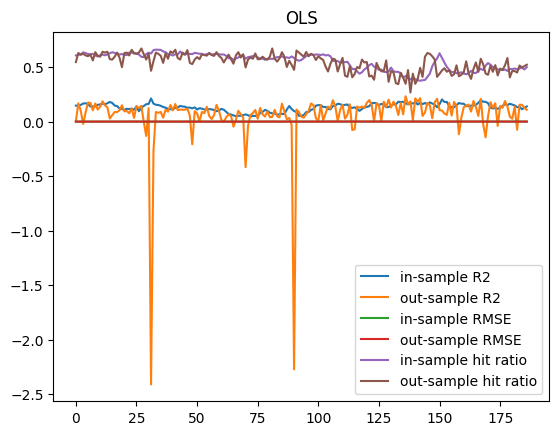

in-sample R2:  0.1315702317821529
out-sample R2:  0.06222414884287497
in-sample RMSE:  0.0009215568672724685
out-sample RMSE:  0.0009429925574253139
in-sample hit ratio:  0.5528810970253767
out-sample hit ratio:  0.5420001795386167

OLS_5_80%



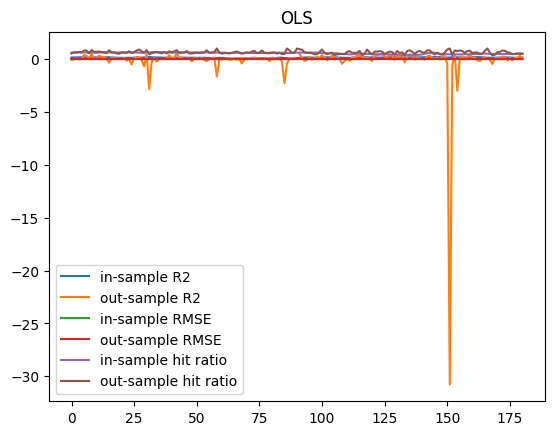

in-sample R2:  0.1336489811543485
out-sample R2:  nan
in-sample RMSE:  0.0009223423720207662
out-sample RMSE:  0.0011098224879022831
in-sample hit ratio:  0.5516485512997505
out-sample hit ratio:  0.6355815013840842

OLS_20_ALL_CASES



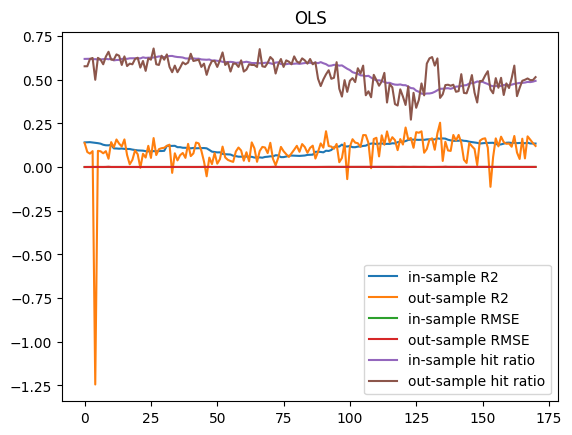

in-sample R2:  0.11287250667645761
out-sample R2:  0.09599234380660197
in-sample RMSE:  0.0009501007204480421
out-sample RMSE:  0.0009466648088805992
in-sample hit ratio:  0.5528348816268465
out-sample hit ratio:  0.5383777911187047

OLS_20_80%



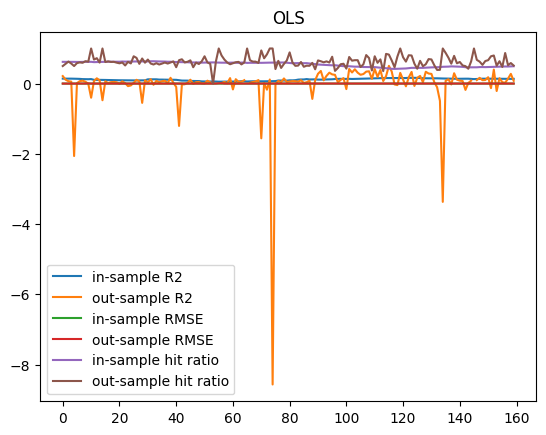

in-sample R2:  0.11453529033381098
out-sample R2:  nan
in-sample RMSE:  0.0009612036219277239
out-sample RMSE:  0.0012416338876544751
in-sample hit ratio:  0.5489636017281097
out-sample hit ratio:  0.6304609826013796

LOGISTIC_5_ALL_CASES



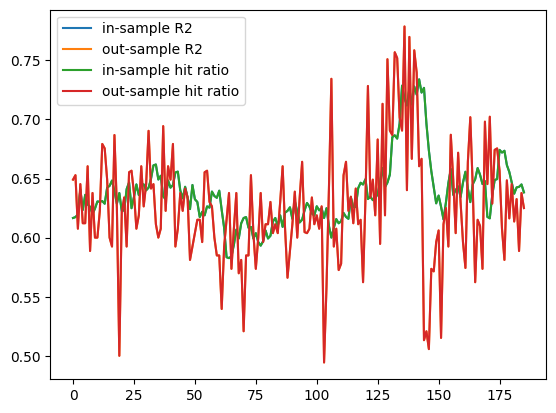

in-sample R2:  0.6374792404678523
out-sample R2:  0.6268707701970971
in-sample RMSE:  1.203213592518912
out-sample RMSE:  1.218968699228737
in-sample hit ratio:  0.6374792404678523
out-sample hit ratio:  0.6268707701970971

LOGISTIC_5_80%



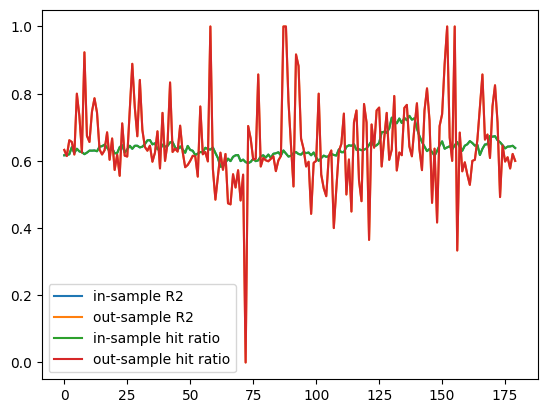

in-sample R2:  0.6383660641182652
out-sample R2:  0.6475006275181104
in-sample RMSE:  1.2017408603623443
out-sample RMSE:  1.1556858479652659
in-sample hit ratio:  0.6383660641182652
out-sample hit ratio:  0.6475006275181104

LOGISTIC_20_ALL_CASES



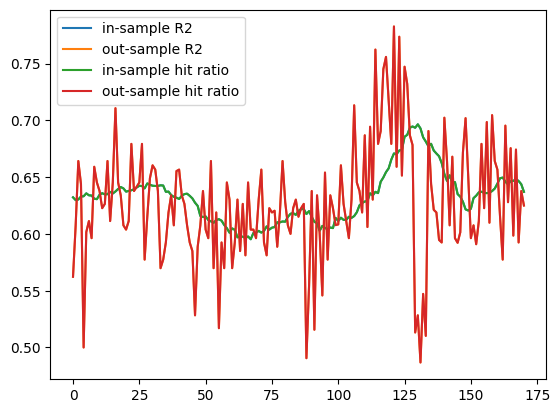

in-sample R2:  0.6325954480740853
out-sample R2:  0.6271428701560312
in-sample RMSE:  1.2116749196129686
out-sample RMSE:  1.2182534484406293
in-sample hit ratio:  0.6325954480740853
out-sample hit ratio:  0.6271428701560312

LOGISTIC_20_80%



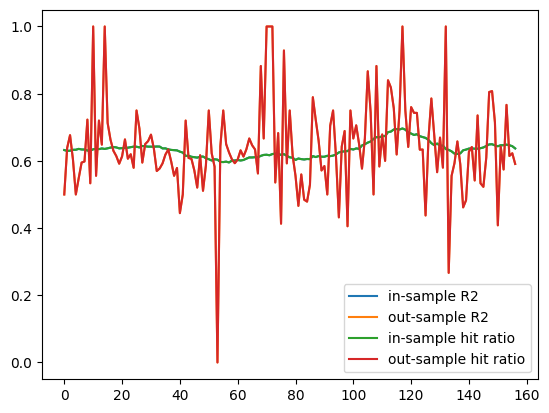

in-sample R2:  0.6337399625032424
out-sample R2:  0.6403815347516127
in-sample RMSE:  1.209770646725298
out-sample RMSE:  1.1585335225282354
in-sample hit ratio:  0.6337399625032424
out-sample hit ratio:  0.6403815347516127
Model for QWF
OLS_5_ALL_CASES



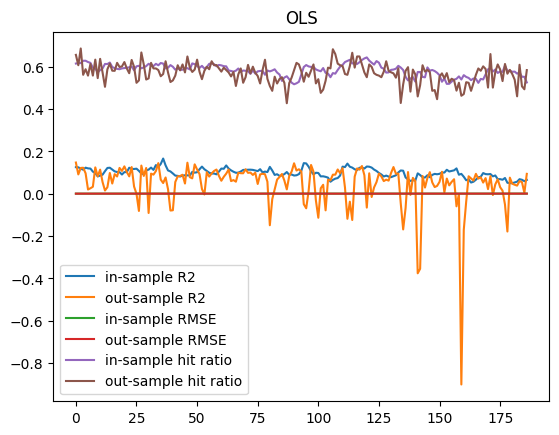

in-sample R2:  0.09856624066439262
out-sample R2:  0.04613807407594907
in-sample RMSE:  0.0006850781976661507
out-sample RMSE:  0.0007028863176726495
in-sample hit ratio:  0.5843025274631882
out-sample hit ratio:  0.5696516428498254

OLS_5_80%



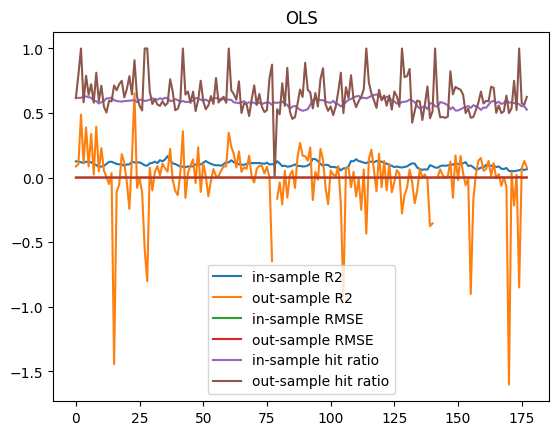

in-sample R2:  0.09999263125539465
out-sample R2:  nan
in-sample RMSE:  0.0006850236799810315
out-sample RMSE:  0.000803424996659738
in-sample hit ratio:  0.5850898949958121
out-sample hit ratio:  0.6320000426545335

OLS_20_ALL_CASES



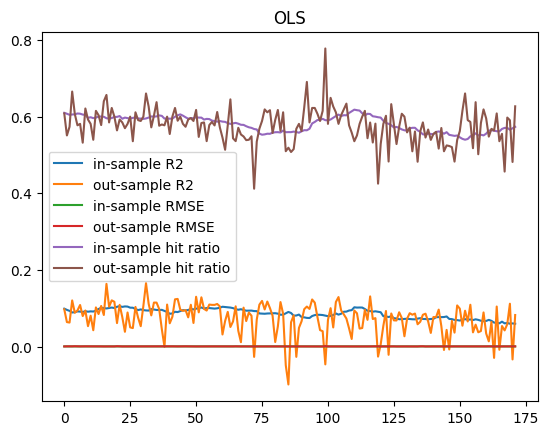

in-sample R2:  0.08644952508646168
out-sample R2:  0.07263437441113789
in-sample RMSE:  0.0006936640855273781
out-sample RMSE:  0.0006952180045924954
in-sample hit ratio:  0.581572537146935
out-sample hit ratio:  0.5768636688984183

OLS_20_80%



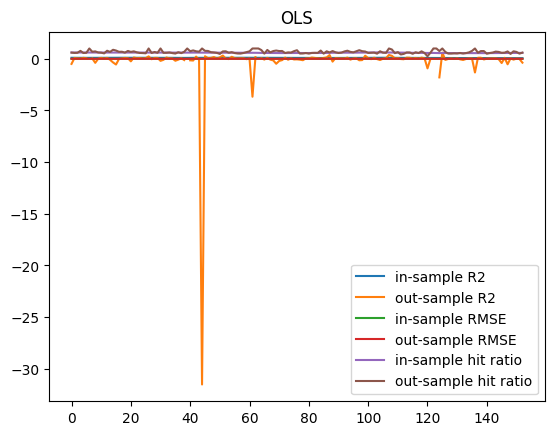

in-sample R2:  0.08716602629284248
out-sample R2:  nan
in-sample RMSE:  0.0006946866348067193
out-sample RMSE:  0.0009364830078259412
in-sample hit ratio:  0.5825011974926775
out-sample hit ratio:  0.6634166057334905

LOGISTIC_5_ALL_CASES



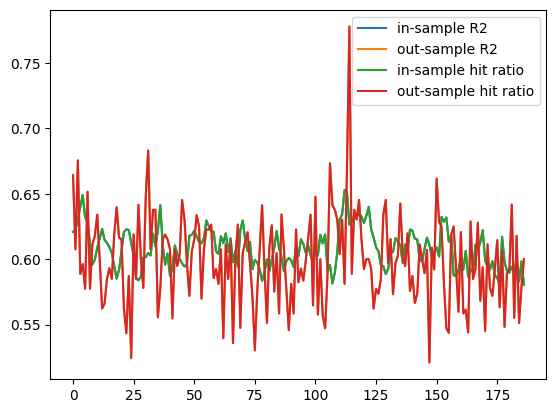

in-sample R2:  0.6081298106559213
out-sample R2:  0.5994093163859178
in-sample RMSE:  1.2517614237210846
out-sample RMSE:  1.264650858107834
in-sample hit ratio:  0.6081298106559213
out-sample hit ratio:  0.5994093163859178

LOGISTIC_5_80%



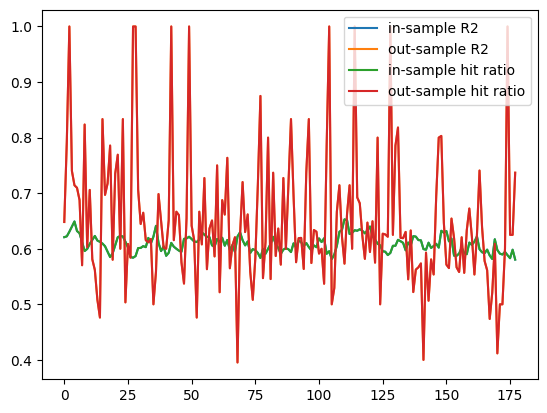

in-sample R2:  0.6086423502856807
out-sample R2:  0.6491842065470246
in-sample RMSE:  1.2509412796374286
out-sample RMSE:  1.1447695512654608
in-sample hit ratio:  0.6086423502856807
out-sample hit ratio:  0.6491842065470246

LOGISTIC_20_ALL_CASES



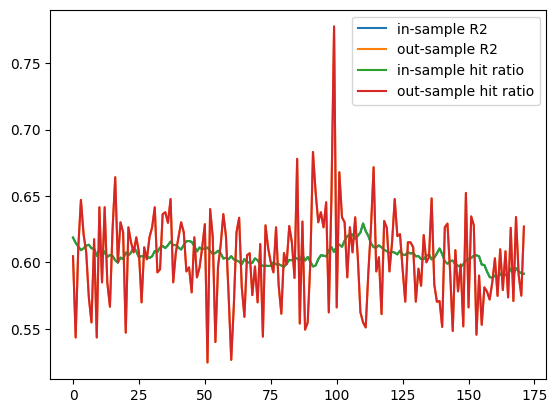

in-sample R2:  0.6052828552002703
out-sample R2:  0.603213531914714
in-sample RMSE:  1.256474908942147
out-sample RMSE:  1.2585959163814513
in-sample hit ratio:  0.6052828552002703
out-sample hit ratio:  0.603213531914714

LOGISTIC_20_80%



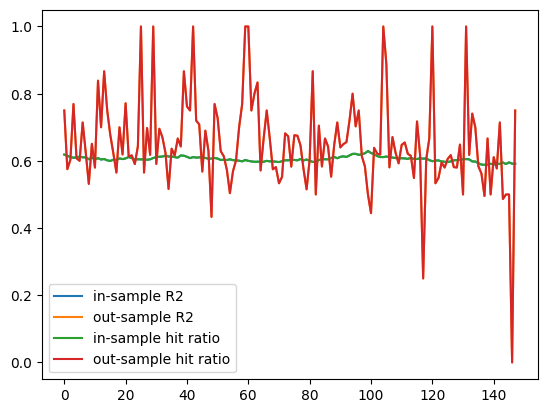

in-sample R2:  0.6052934071417037
out-sample R2:  0.6522725064455215
in-sample RMSE:  1.256456068252249
out-sample RMSE:  1.1348068883629225
in-sample hit ratio:  0.6052934071417037
out-sample hit ratio:  0.6522725064455215
Model for HCF
OLS_5_ALL_CASES



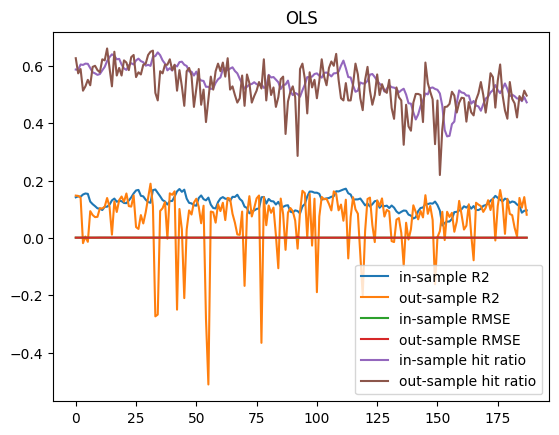

in-sample R2:  0.12215966299535093
out-sample R2:  0.06293553658744924
in-sample RMSE:  0.000644790051450737
out-sample RMSE:  0.0006706866017484636
in-sample hit ratio:  0.5433191712379162
out-sample hit ratio:  0.5242895630677389

OLS_5_80%



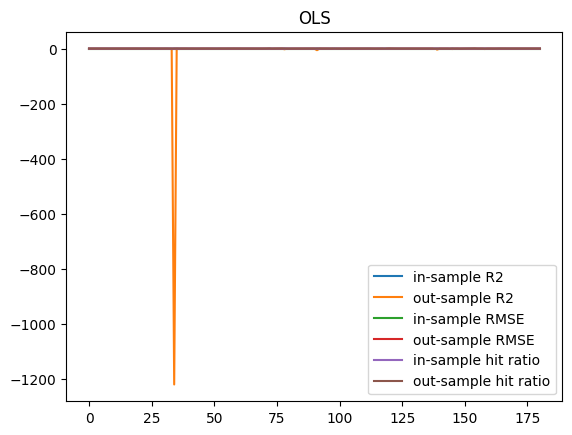

in-sample R2:  0.12229586260243928
out-sample R2:  nan
in-sample RMSE:  0.0006441886750070328
out-sample RMSE:  0.0006921564786982559
in-sample hit ratio:  0.5423713210926495
out-sample hit ratio:  0.6017193548346889

OLS_20_ALL_CASES



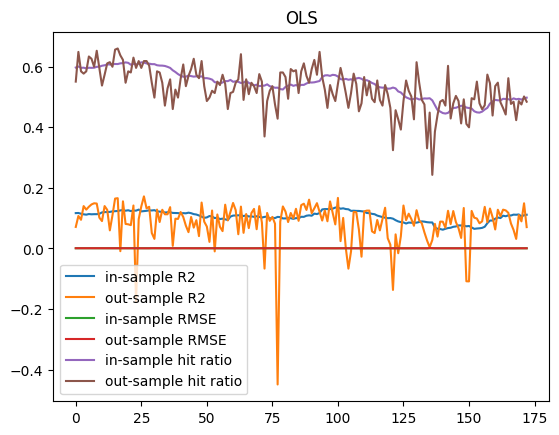

in-sample R2:  0.10544392986496205
out-sample R2:  0.08581732225581111
in-sample RMSE:  0.0006520483743713188
out-sample RMSE:  0.0006409506807707597
in-sample hit ratio:  0.541938330998852
out-sample hit ratio:  0.5291386277851763

OLS_20_80%



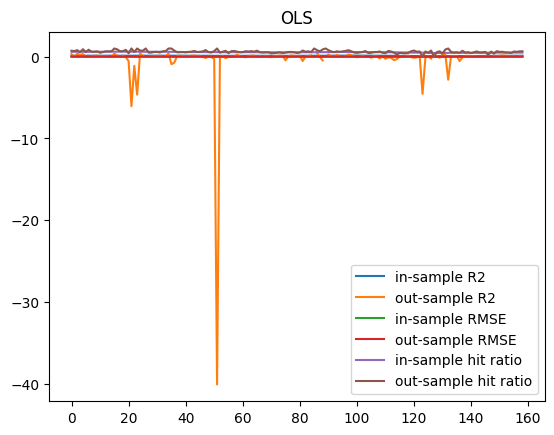

in-sample R2:  0.10627826384762265
out-sample R2:  nan
in-sample RMSE:  0.0006552162844213334
out-sample RMSE:  0.0007649820934731538
in-sample hit ratio:  0.5436549217089256
out-sample hit ratio:  0.6105654489042932

LOGISTIC_5_ALL_CASES



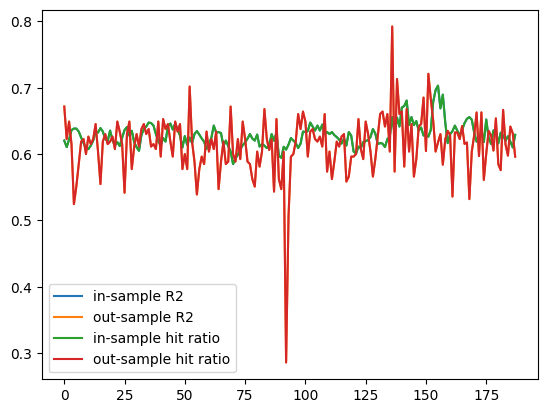

in-sample R2:  0.6284585703186816
out-sample R2:  0.6140802173734679
in-sample RMSE:  1.2187318169235715
out-sample RMSE:  1.2404863289749997
in-sample hit ratio:  0.6284585703186816
out-sample hit ratio:  0.6140802173734679

LOGISTIC_5_80%



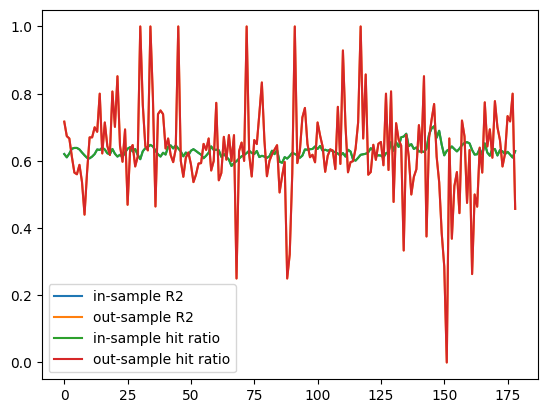

in-sample R2:  0.6282467359311912
out-sample R2:  0.6314154489091041
in-sample RMSE:  1.2190792903179524
out-sample RMSE:  1.1792470421406085
in-sample hit ratio:  0.6282467359311912
out-sample hit ratio:  0.6314154489091041

LOGISTIC_20_ALL_CASES



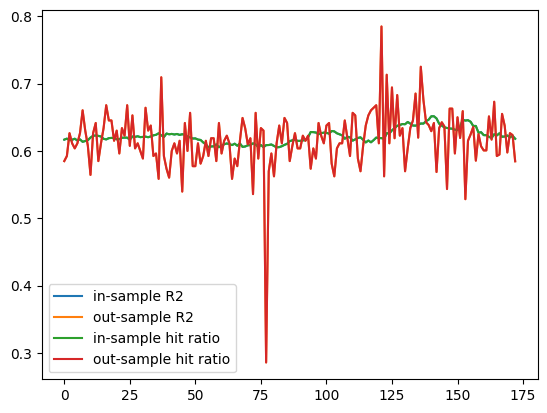

in-sample R2:  0.6219989677683517
out-sample R2:  0.6167007480391812
in-sample RMSE:  1.2295139972220528
out-sample RMSE:  1.2363250045725485
in-sample hit ratio:  0.6219989677683517
out-sample hit ratio:  0.6167007480391812

LOGISTIC_20_80%



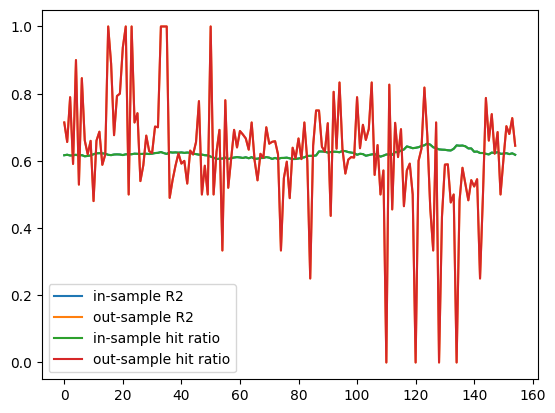

in-sample R2:  0.6213722323318372
out-sample R2:  0.6241270308888235
in-sample RMSE:  1.2305409277013515
out-sample RMSE:  1.1772580961685988
in-sample hit ratio:  0.6213722323318372
out-sample hit ratio:  0.6241270308888235
Model for DBF
OLS_5_ALL_CASES



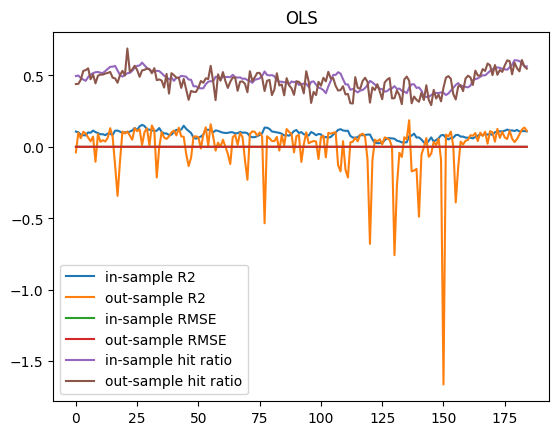

in-sample R2:  0.08937200201809097
out-sample R2:  0.008064190145666457
in-sample RMSE:  0.0007937342628665675
out-sample RMSE:  0.0008141533751148508
in-sample hit ratio:  0.46945029008809136
out-sample hit ratio:  0.45626346517582644

OLS_5_80%



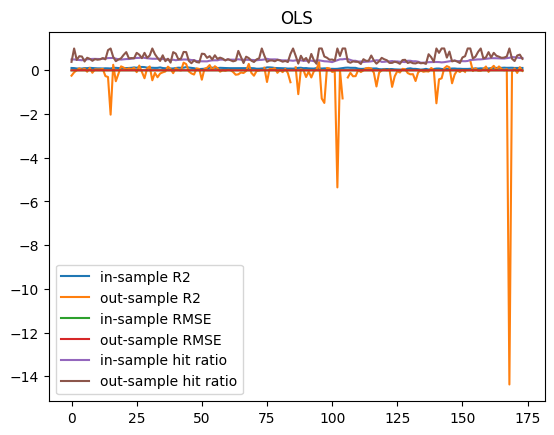

in-sample R2:  0.09171345483090744
out-sample R2:  nan
in-sample RMSE:  0.0007932167480551623
out-sample RMSE:  0.0008639163740159021
in-sample hit ratio:  0.4714580252105388
out-sample hit ratio:  0.5760656655222423

OLS_20_ALL_CASES



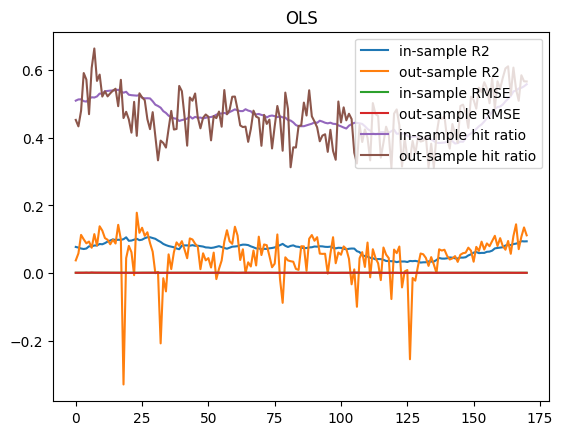

in-sample R2:  0.07053368871127721
out-sample R2:  0.05308224049999883
in-sample RMSE:  0.000808233869202868
out-sample RMSE:  0.0007892893993311098
in-sample hit ratio:  0.46106504685026367
out-sample hit ratio:  0.4592797352292109

OLS_20_80%



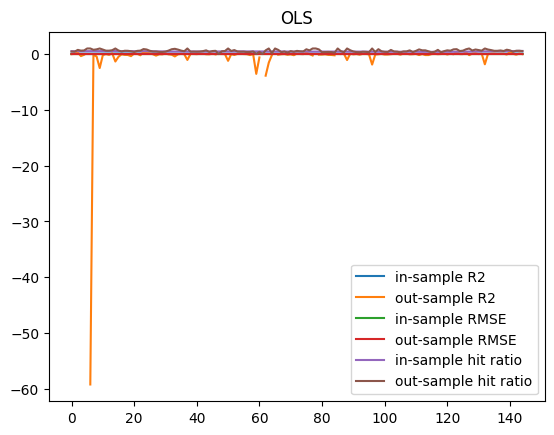

in-sample R2:  0.07193685648129987
out-sample R2:  nan
in-sample RMSE:  0.0008124487462238047
out-sample RMSE:  0.0008926448557880175
in-sample hit ratio:  0.4640489958191094
out-sample hit ratio:  0.5866314073514721

LOGISTIC_5_ALL_CASES



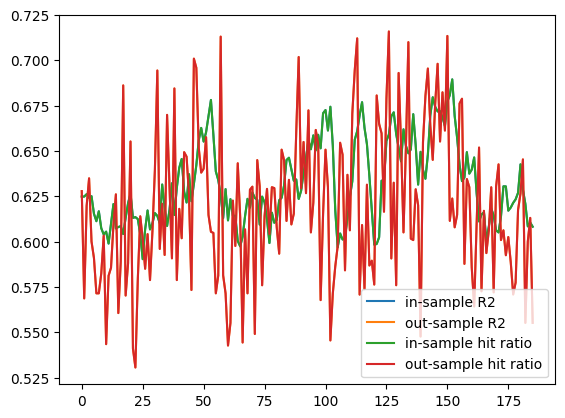

in-sample R2:  0.6317632227436893
out-sample R2:  0.6188880407842164
in-sample RMSE:  1.2130671159358126
out-sample RMSE:  1.2328496606112067
in-sample hit ratio:  0.6317632227436893
out-sample hit ratio:  0.6188880407842164

LOGISTIC_5_80%



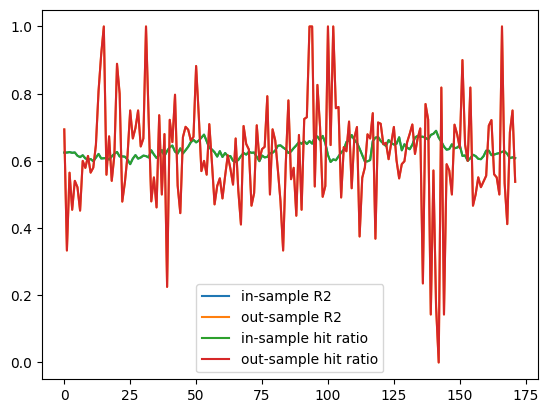

in-sample R2:  0.6314764087866608
out-sample R2:  0.6176149824759993
in-sample RMSE:  1.213538789177293
out-sample RMSE:  1.1925608071099678
in-sample hit ratio:  0.6314764087866608
out-sample hit ratio:  0.6176149824759993

LOGISTIC_20_ALL_CASES



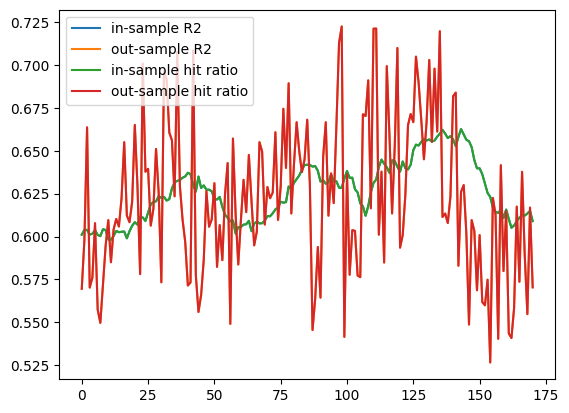

in-sample R2:  0.6260526341955912
out-sample R2:  0.6221666344936789
in-sample RMSE:  1.222686595486704
out-sample RMSE:  1.2271857283327827
in-sample hit ratio:  0.6260526341955912
out-sample hit ratio:  0.6221666344936789

LOGISTIC_20_80%



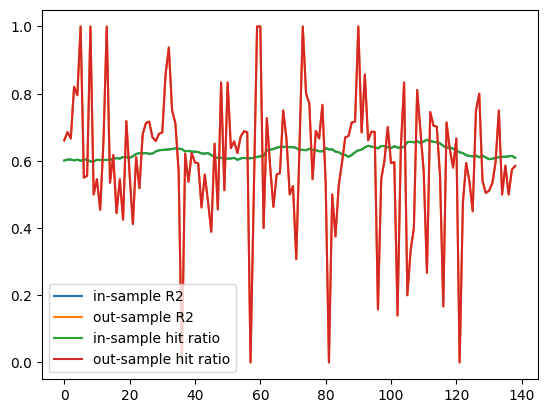

in-sample R2:  0.6248094294463109
out-sample R2:  0.6019465354032215
in-sample RMSE:  1.2247687294797283
out-sample RMSE:  1.2047110679052968
in-sample hit ratio:  0.6248094294463109
out-sample hit ratio:  0.6019465354032215
Model for EHF
OLS_5_ALL_CASES



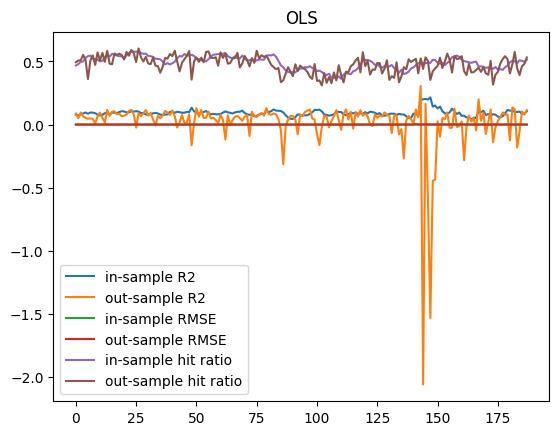

in-sample R2:  0.09252282438591085
out-sample R2:  0.015944251656356545
in-sample RMSE:  0.000670917422994074
out-sample RMSE:  0.0006710385654410674
in-sample hit ratio:  0.49177912702715204
out-sample hit ratio:  0.47599918057496887

OLS_5_80%



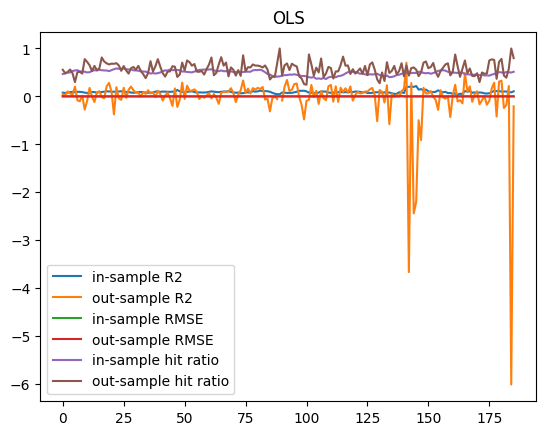

in-sample R2:  0.09268482895389236
out-sample R2:  nan
in-sample RMSE:  0.0006705109256068638
out-sample RMSE:  0.0007829837205946424
in-sample hit ratio:  0.49183141490792714
out-sample hit ratio:  0.5744582502160829

OLS_20_ALL_CASES



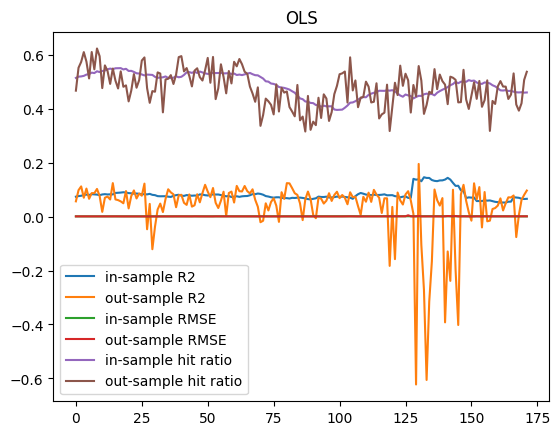

in-sample R2:  0.0811898497453747
out-sample R2:  0.03496757112693528
in-sample RMSE:  0.0006990765878625431
out-sample RMSE:  0.0006594299943374602
in-sample hit ratio:  0.48772350184322044
out-sample hit ratio:  0.47690640940217716

OLS_20_80%



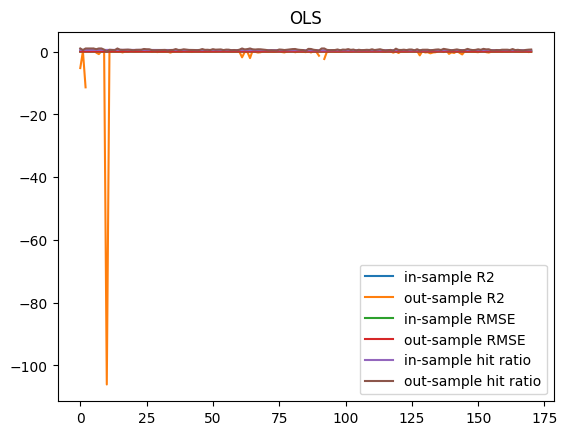

in-sample R2:  0.08126521574225283
out-sample R2:  nan
in-sample RMSE:  0.0006999453623402533
out-sample RMSE:  0.0008321315285985457
in-sample hit ratio:  0.48780333245685
out-sample hit ratio:  0.6054834470368788

LOGISTIC_5_ALL_CASES



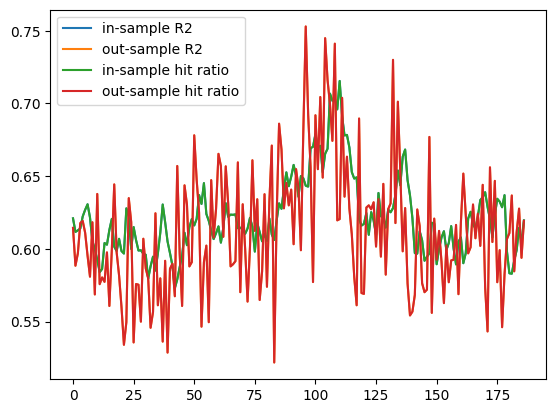

in-sample R2:  0.621781603297723
out-sample R2:  0.6123522419150464
in-sample RMSE:  1.2292115246660318
out-sample RMSE:  1.2431570326201866
in-sample hit ratio:  0.621781603297723
out-sample hit ratio:  0.6123522419150464

LOGISTIC_5_80%



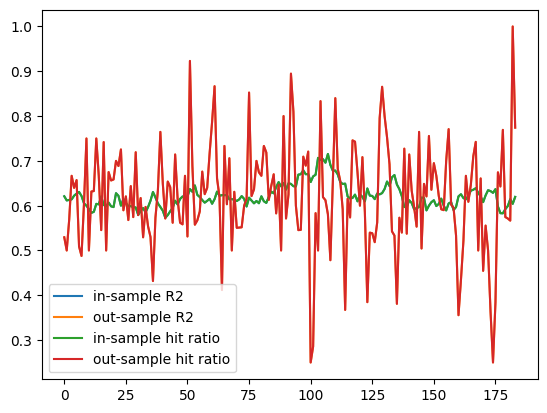

in-sample R2:  0.6214819248263506
out-sample R2:  0.6204656298146667
in-sample RMSE:  1.22969922473785
out-sample RMSE:  1.2142948600660766
in-sample hit ratio:  0.6214819248263506
out-sample hit ratio:  0.6204656298146667

LOGISTIC_20_ALL_CASES



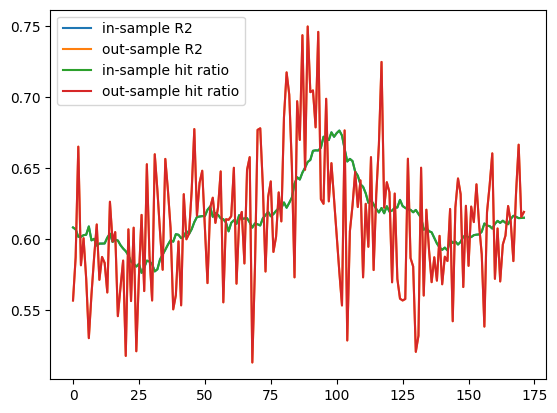

in-sample R2:  0.6154536707411491
out-sample R2:  0.6116795858226013
in-sample RMSE:  1.2397038627380794
out-sample RMSE:  1.2440421914024087
in-sample hit ratio:  0.6154536707411491
out-sample hit ratio:  0.6116795858226013

LOGISTIC_20_80%



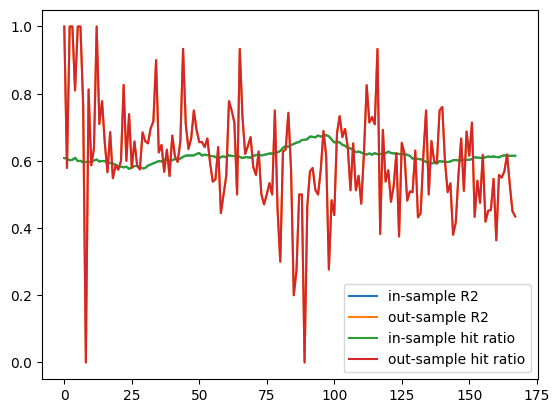

in-sample R2:  0.6152666444438939
out-sample R2:  0.6047024006225296
in-sample RMSE:  1.2400104606814817
out-sample RMSE:  1.2157733090389624
in-sample hit ratio:  0.6152666444438939
out-sample hit ratio:  0.6047024006225296
Model for IPF
OLS_5_ALL_CASES



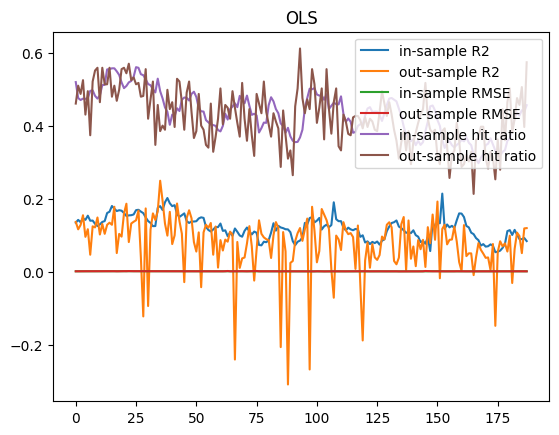

in-sample R2:  0.12124841516231048
out-sample R2:  0.07753591392965399
in-sample RMSE:  0.0009250003566372199
out-sample RMSE:  0.0009392501085159079
in-sample hit ratio:  0.4326865598648812
out-sample hit ratio:  0.42332436010198005

OLS_5_80%



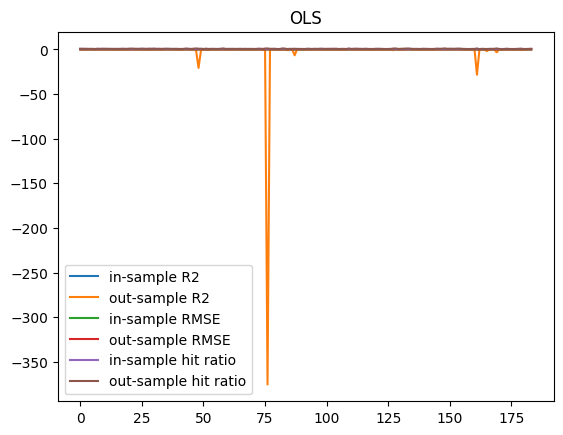

in-sample R2:  0.12152315043338656
out-sample R2:  nan
in-sample RMSE:  0.0009260400623617241
out-sample RMSE:  0.0010575809107316004
in-sample hit ratio:  0.43290999553251336
out-sample hit ratio:  0.567920731752628

OLS_20_ALL_CASES



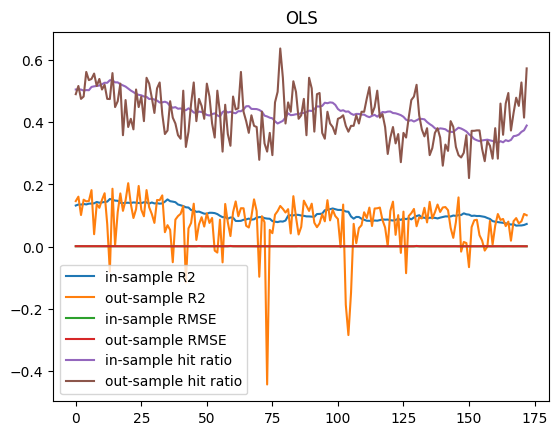

in-sample R2:  0.10572867301031297
out-sample R2:  0.07882948631196623
in-sample RMSE:  0.0009374170230673609
out-sample RMSE:  0.0009221586950974657
in-sample hit ratio:  0.42974290864205705
out-sample hit ratio:  0.41935169027859326

OLS_20_80%



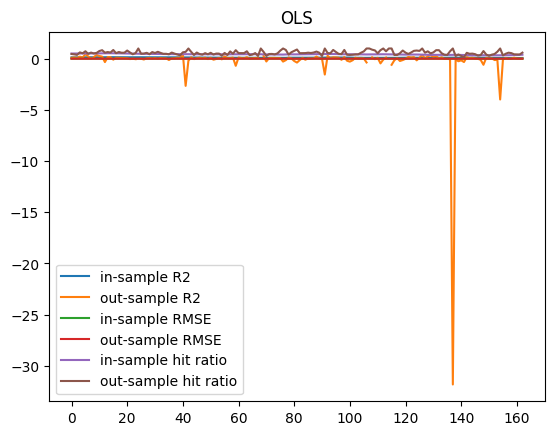

in-sample R2:  0.10617507267357633
out-sample R2:  nan
in-sample RMSE:  0.000939042198507501
out-sample RMSE:  0.0010574727657623874
in-sample hit ratio:  0.42960404194607543
out-sample hit ratio:  0.5845754957263865

LOGISTIC_5_ALL_CASES



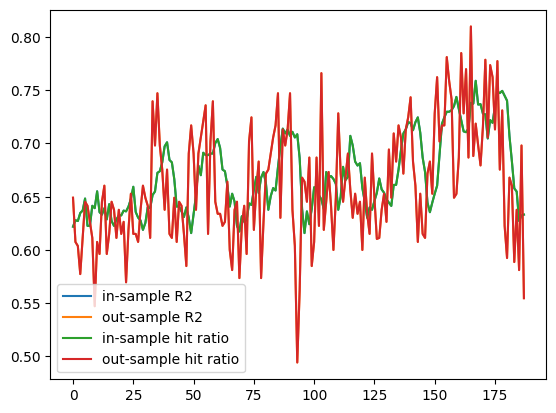

in-sample R2:  0.6702319045680623
out-sample R2:  0.6607554481348005
in-sample RMSE:  1.1466715444804718
out-sample RMSE:  1.1610713404346025
in-sample hit ratio:  0.6702319045680623
out-sample hit ratio:  0.6607554481348005

LOGISTIC_5_80%



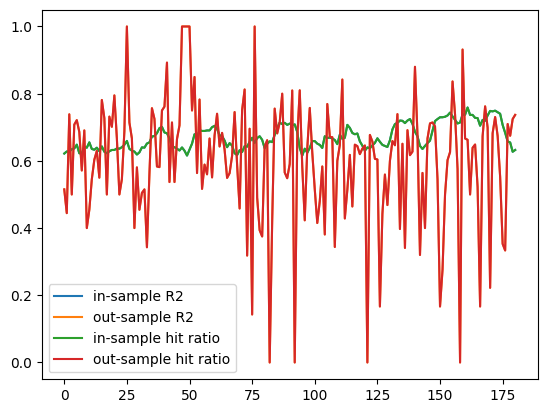

in-sample R2:  0.6707389615196897
out-sample R2:  0.6011145167858946
in-sample RMSE:  1.1457620082878015
out-sample RMSE:  1.2171087503693818
in-sample hit ratio:  0.6707389615196897
out-sample hit ratio:  0.6011145167858946

LOGISTIC_20_ALL_CASES



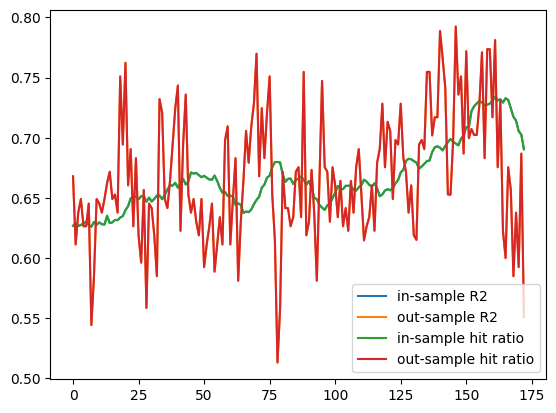

in-sample R2:  0.6669684021038953
out-sample R2:  0.6674859269578107
in-sample RMSE:  1.1531373434205883
out-sample RMSE:  1.1495394432487283
in-sample hit ratio:  0.6669684021038953
out-sample hit ratio:  0.6674859269578107

LOGISTIC_20_80%



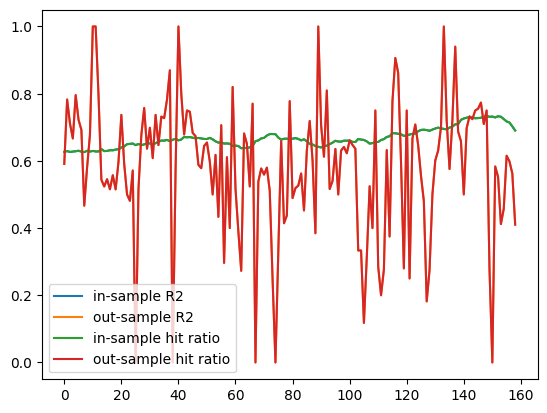

in-sample R2:  0.6674964215104228
out-sample R2:  0.5815088549697616
in-sample RMSE:  1.152159884540575
out-sample RMSE:  1.2449120049214113
in-sample hit ratio:  0.6674964215104228
out-sample hit ratio:  0.5815088549697616
Model for IIF
OLS_5_ALL_CASES



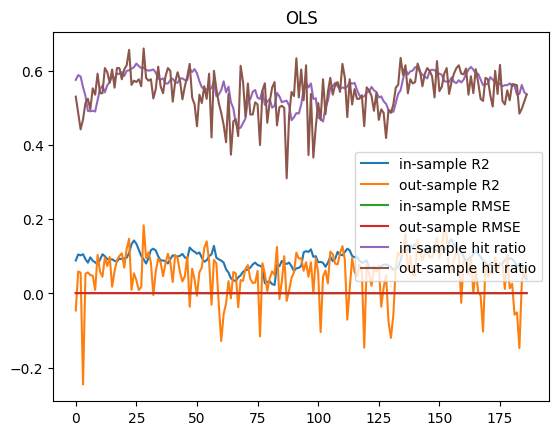

in-sample R2:  0.09128144028444643
out-sample R2:  0.051524960850994436
in-sample RMSE:  0.0006292795858374024
out-sample RMSE:  0.0006377519350518974
in-sample hit ratio:  0.5545678921416345
out-sample hit ratio:  0.5418285895993425

OLS_5_80%



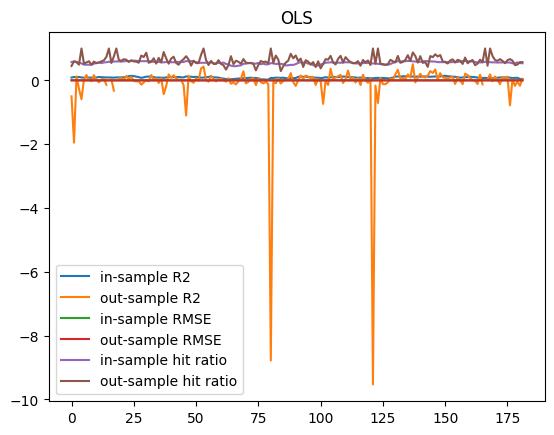

in-sample R2:  0.09187985828613465
out-sample R2:  nan
in-sample RMSE:  0.0006275627610135647
out-sample RMSE:  0.0006609259146365388
in-sample hit ratio:  0.5544576854106712
out-sample hit ratio:  0.6191712342292071

OLS_20_ALL_CASES



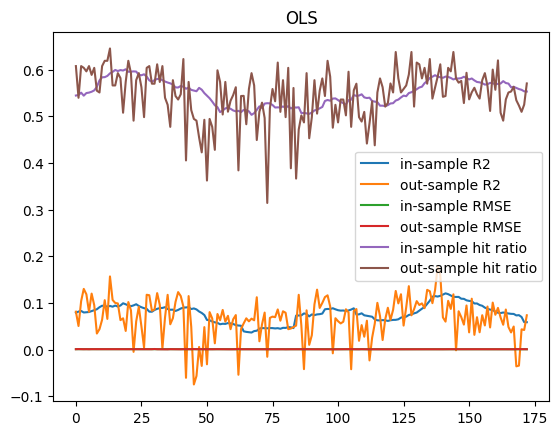

in-sample R2:  0.0781372284856125
out-sample R2:  0.06690216887052297
in-sample RMSE:  0.0006311391234148098
out-sample RMSE:  0.0006201727051843299
in-sample hit ratio:  0.5510185165229579
out-sample hit ratio:  0.5451200285971459

OLS_20_80%



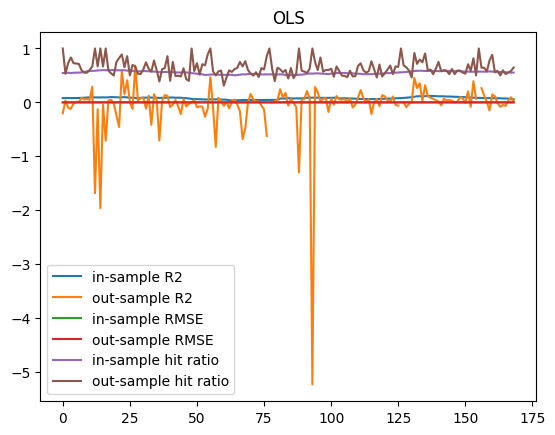

in-sample R2:  0.07826692278781117
out-sample R2:  nan
in-sample RMSE:  0.0006302456716459177
out-sample RMSE:  0.0006705846479027302
in-sample hit ratio:  0.5511174033160718
out-sample hit ratio:  0.6390101965550412

LOGISTIC_5_ALL_CASES



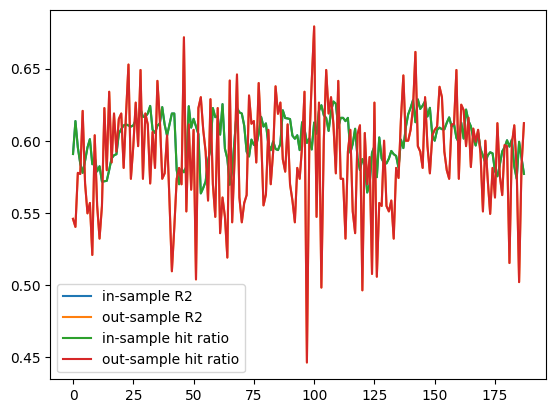

in-sample R2:  0.6010668407542299
out-sample R2:  0.5876227336829271
in-sample RMSE:  1.2629852038274545
out-sample RMSE:  1.2830337876406361
in-sample hit ratio:  0.6010668407542299
out-sample hit ratio:  0.5876227336829271

LOGISTIC_5_80%



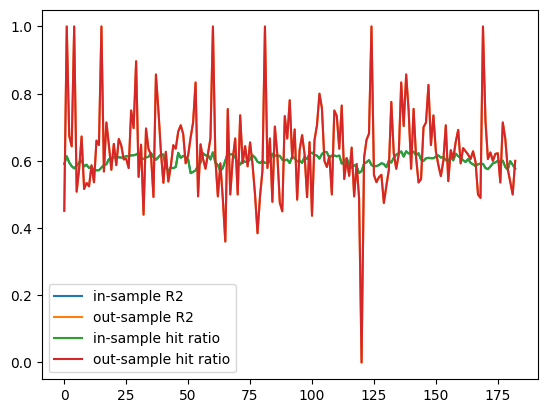

in-sample R2:  0.601158053780949
out-sample R2:  0.6286639610967842
in-sample RMSE:  1.2628423235003772
out-sample RMSE:  1.1842876306649324
in-sample hit ratio:  0.601158053780949
out-sample hit ratio:  0.6286639610967842

LOGISTIC_20_ALL_CASES



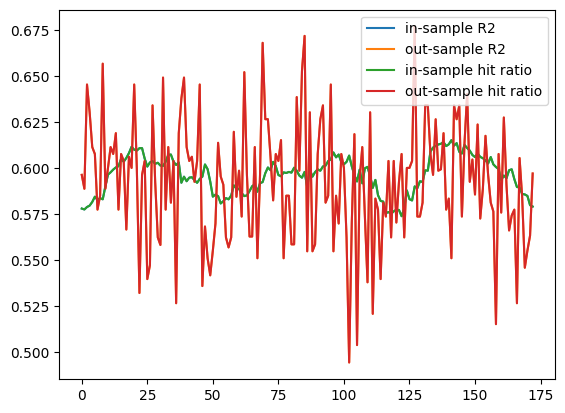

in-sample R2:  0.5961336107775679
out-sample R2:  0.5921101433389713
in-sample RMSE:  1.270910478266743
out-sample RMSE:  1.276286169164744
in-sample hit ratio:  0.5961336107775679
out-sample hit ratio:  0.5921101433389713

LOGISTIC_20_80%



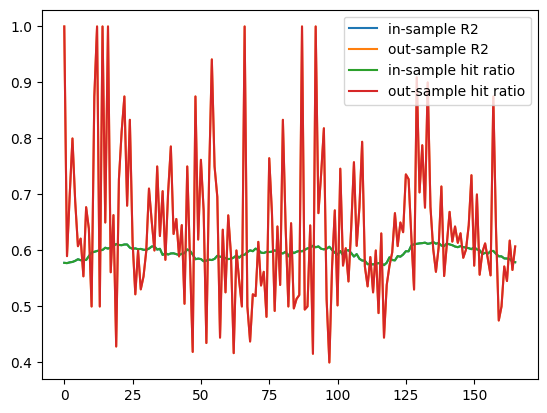

in-sample R2:  0.5960662174550755
out-sample R2:  0.637954765474263
in-sample RMSE:  1.2710132721382061
out-sample RMSE:  1.1627564610762282
in-sample hit ratio:  0.5960662174550755
out-sample hit ratio:  0.637954765474263
Model for QXF
OLS_5_ALL_CASES



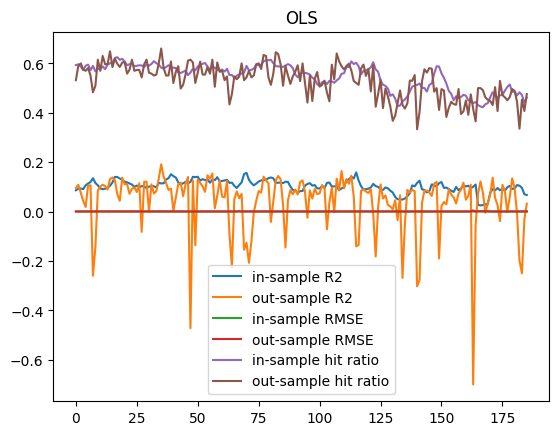

in-sample R2:  0.10485911807950186
out-sample R2:  0.042283040983396164
in-sample RMSE:  0.0006302959319215622
out-sample RMSE:  0.0006267469246548652
in-sample hit ratio:  0.5463362511452295
out-sample hit ratio:  0.5288434269136046

OLS_5_80%



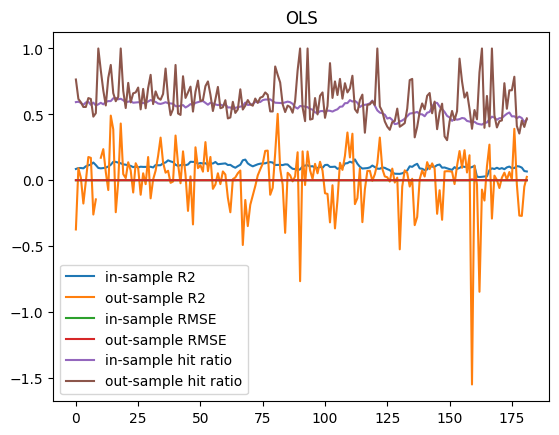

in-sample R2:  0.10503217423550607
out-sample R2:  nan
in-sample RMSE:  0.0006295702574507702
out-sample RMSE:  0.0006641380740815549
in-sample hit ratio:  0.5456732023078334
out-sample hit ratio:  0.6072331179540188

OLS_20_ALL_CASES



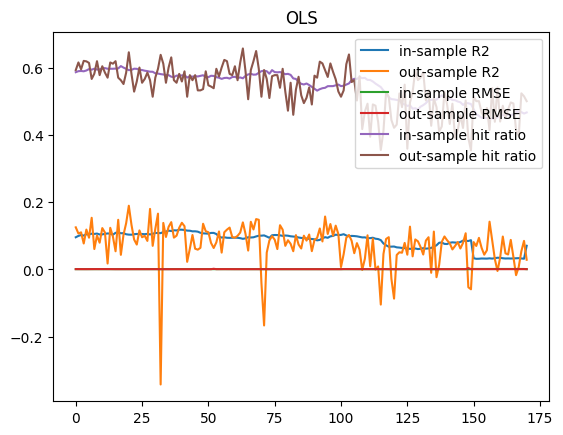

in-sample R2:  0.08714488931461552
out-sample R2:  0.07536225613384685
in-sample RMSE:  0.0006679520534252998
out-sample RMSE:  0.0006086149971899721
in-sample hit ratio:  0.5450359655311908
out-sample hit ratio:  0.53558684597467

OLS_20_80%



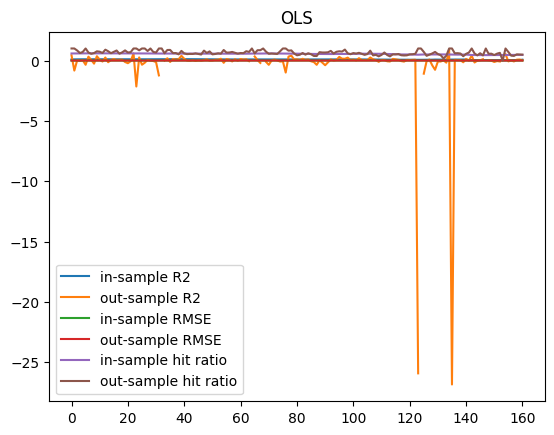

in-sample R2:  0.08831442412018327
out-sample R2:  nan
in-sample RMSE:  0.0006703275810551172
out-sample RMSE:  0.000661762714319542
in-sample hit ratio:  0.5475950180766068
out-sample hit ratio:  0.6560793331917034

LOGISTIC_5_ALL_CASES



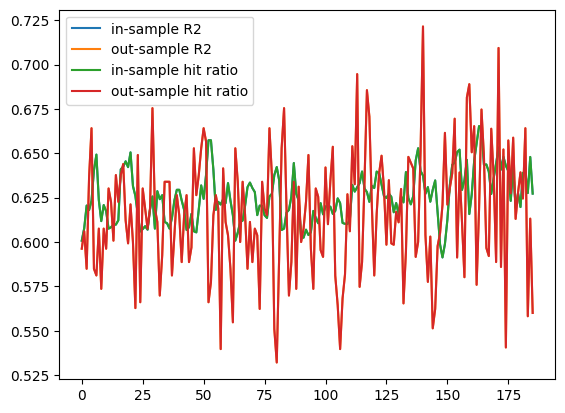

in-sample R2:  0.6254109431248278
out-sample R2:  0.615823210486398
in-sample RMSE:  1.223852719831249
out-sample RMSE:  1.2383959606902577
in-sample hit ratio:  0.6254109431248278
out-sample hit ratio:  0.615823210486398

LOGISTIC_5_80%



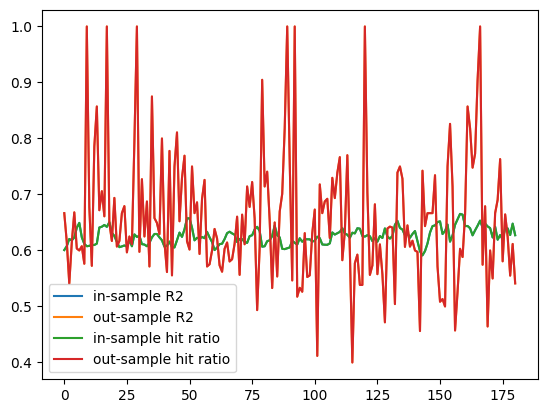

in-sample R2:  0.6255433908410676
out-sample R2:  0.656209184821787
in-sample RMSE:  1.2236330132397366
out-sample RMSE:  1.139050413286253
in-sample hit ratio:  0.6255433908410676
out-sample hit ratio:  0.656209184821787

LOGISTIC_20_ALL_CASES



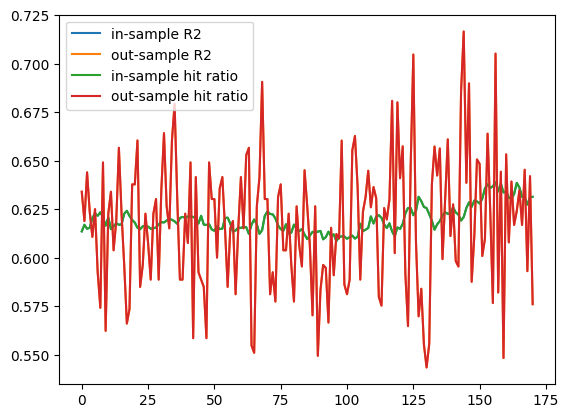

in-sample R2:  0.6196826598585818
out-sample R2:  0.617334030767422
in-sample RMSE:  1.2333465055756707
out-sample RMSE:  1.235980725946037
in-sample hit ratio:  0.6196826598585818
out-sample hit ratio:  0.617334030767422

LOGISTIC_20_80%



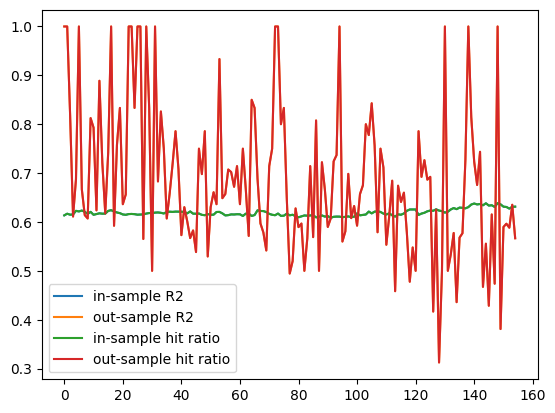

in-sample R2:  0.6191661317360653
out-sample R2:  0.6850291999174579
in-sample RMSE:  1.2341857389748754
out-sample RMSE:  1.048424363110704
in-sample hit ratio:  0.6191661317360653
out-sample hit ratio:  0.6850291999174579
Model for PEF
OLS_5_ALL_CASES



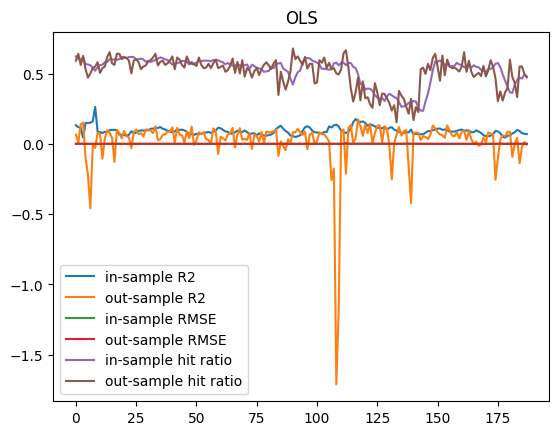

in-sample R2:  0.09345416234942609
out-sample R2:  0.022679656904118876
in-sample RMSE:  0.0007363035760734034
out-sample RMSE:  0.0007689577799637593
in-sample hit ratio:  0.5220524299967628
out-sample hit ratio:  0.5096587137313953

OLS_5_80%



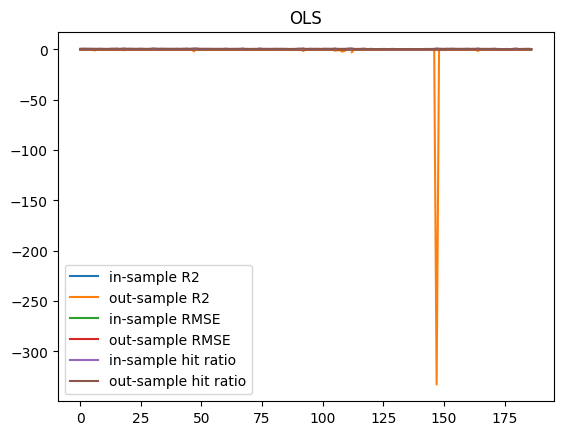

in-sample R2:  0.09344858967525062
out-sample R2:  nan
in-sample RMSE:  0.0007340165243085393
out-sample RMSE:  0.0008754715266200813
in-sample hit ratio:  0.5231006369173388
out-sample hit ratio:  0.6008937382125783

OLS_20_ALL_CASES



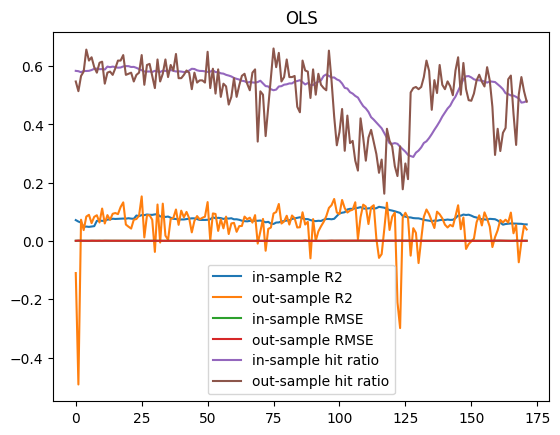

in-sample R2:  0.07836212369899954
out-sample R2:  0.05617093584134103
in-sample RMSE:  0.0007429504888590573
out-sample RMSE:  0.0007295872376500436
in-sample hit ratio:  0.5192442979681574
out-sample hit ratio:  0.506503822675092

OLS_20_80%



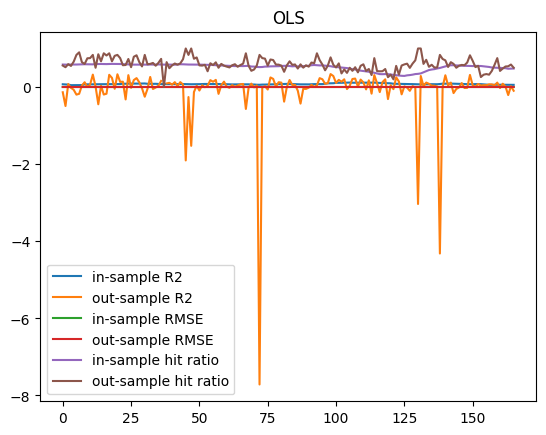

in-sample R2:  0.0785792181511114
out-sample R2:  nan
in-sample RMSE:  0.0007420268089169285
out-sample RMSE:  0.0008438266727810799
in-sample hit ratio:  0.5204863461180872
out-sample hit ratio:  0.5940164088392679

LOGISTIC_5_ALL_CASES



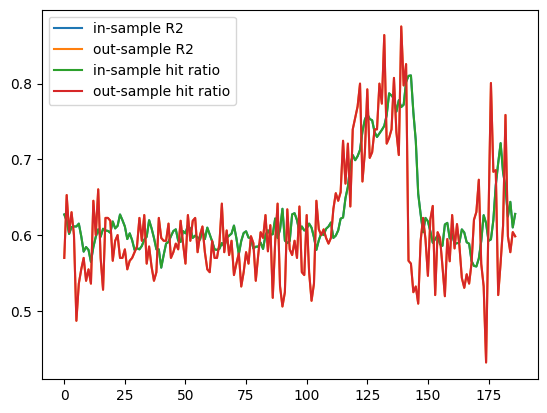

in-sample R2:  0.6258877606626928
out-sample R2:  0.6097959315420293
in-sample RMSE:  1.218909623165761
out-sample RMSE:  1.2425015465360458
in-sample hit ratio:  0.6258877606626928
out-sample hit ratio:  0.6097959315420293

LOGISTIC_5_80%



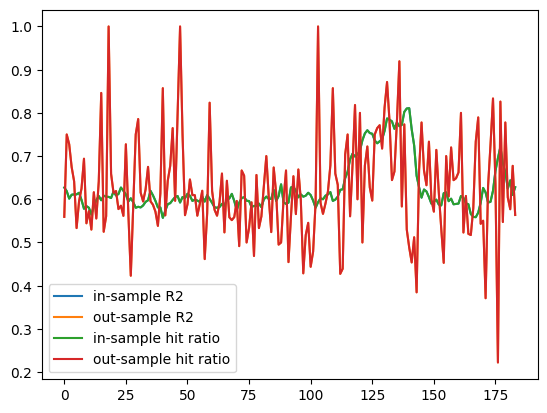

in-sample R2:  0.6255961439630793
out-sample R2:  0.627002064268286
in-sample RMSE:  1.219426384628283
out-sample RMSE:  1.1978990014261675
in-sample hit ratio:  0.6255961439630793
out-sample hit ratio:  0.627002064268286

LOGISTIC_20_ALL_CASES



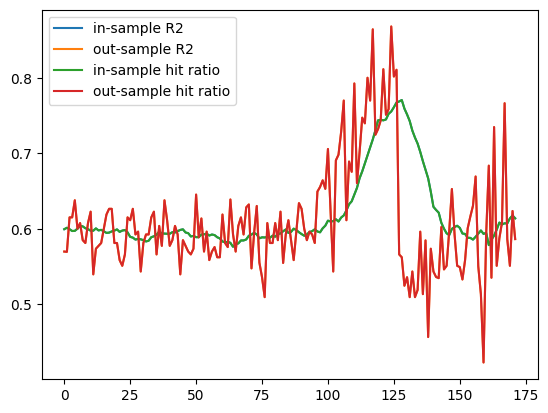

in-sample R2:  0.6176142022424349
out-sample R2:  0.609842727835836
in-sample RMSE:  1.2337151505837363
out-sample RMSE:  1.2427701665279236
in-sample hit ratio:  0.6176142022424349
out-sample hit ratio:  0.609842727835836

LOGISTIC_20_80%



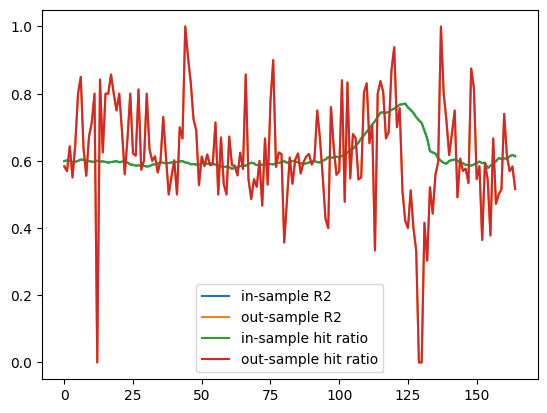

in-sample R2:  0.6171396582315809
out-sample R2:  0.6189354452074616
in-sample RMSE:  1.234452127904004
out-sample RMSE:  1.2019924129058261
in-sample hit ratio:  0.6171396582315809
out-sample hit ratio:  0.6189354452074616
Model for NAF
OLS_5_ALL_CASES



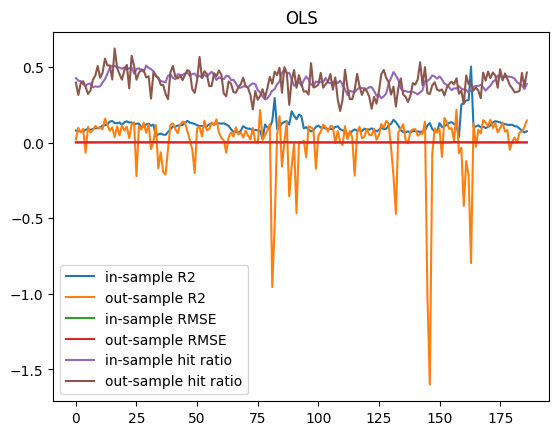

in-sample R2:  0.10934818592858962
out-sample R2:  0.013331441487000325
in-sample RMSE:  0.0010321556770026938
out-sample RMSE:  0.0010461638876645887
in-sample hit ratio:  0.4009748264596261
out-sample hit ratio:  0.39290657460313666

OLS_5_80%



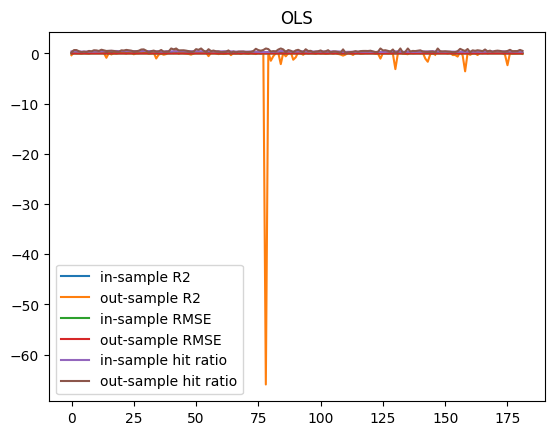

in-sample R2:  0.10969561751304763
out-sample R2:  nan
in-sample RMSE:  0.0010333232275439798
out-sample RMSE:  0.0012421580224762667
in-sample hit ratio:  0.40078012376110217
out-sample hit ratio:  0.510703031119562

OLS_20_ALL_CASES



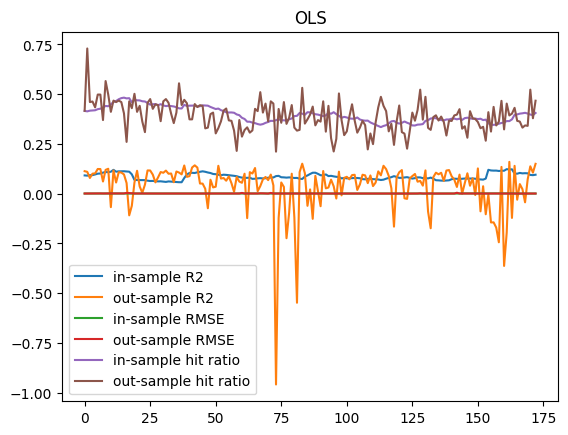

in-sample R2:  0.08609021946951312
out-sample R2:  0.038558306147035926
in-sample RMSE:  0.0011081113915412833
out-sample RMSE:  0.0010201626430142725
in-sample hit ratio:  0.39631029530768674
out-sample hit ratio:  0.3884389977455436

OLS_20_80%



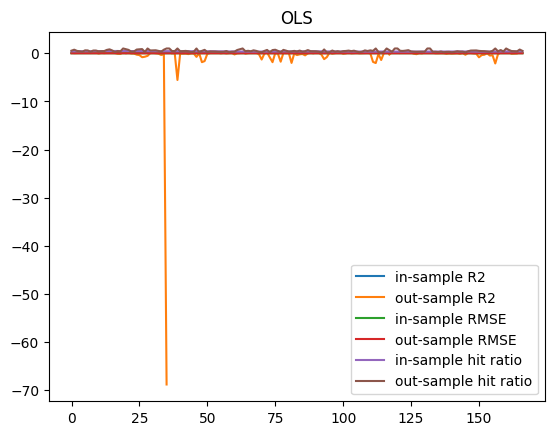

in-sample R2:  0.08661160892441652
out-sample R2:  nan
in-sample RMSE:  0.0011020957934964617
out-sample RMSE:  0.0011805707712888899
in-sample hit ratio:  0.3965969252899783
out-sample hit ratio:  0.501861526552881

LOGISTIC_5_ALL_CASES



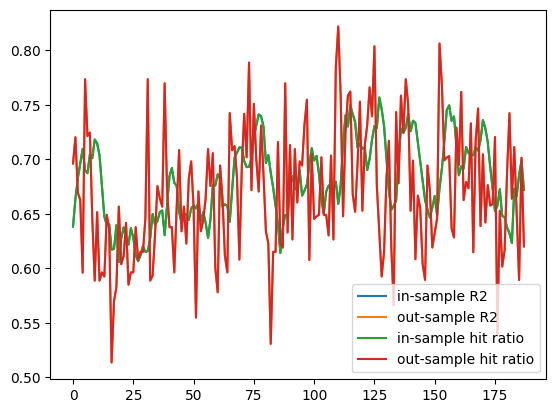

in-sample R2:  0.6797114787271534
out-sample R2:  0.6686444603463627
in-sample RMSE:  1.1300709616037286
out-sample RMSE:  1.146569751185031
in-sample hit ratio:  0.6797114787271534
out-sample hit ratio:  0.6686444603463627

LOGISTIC_5_80%



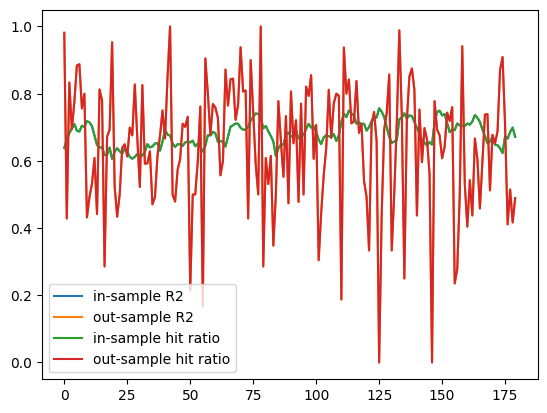

in-sample R2:  0.6798308860422742
out-sample R2:  0.6437087815621513
in-sample RMSE:  1.1298330307537252
out-sample RMSE:  1.1461151548281059
in-sample hit ratio:  0.6798308860422742
out-sample hit ratio:  0.6437087815621513

LOGISTIC_20_ALL_CASES



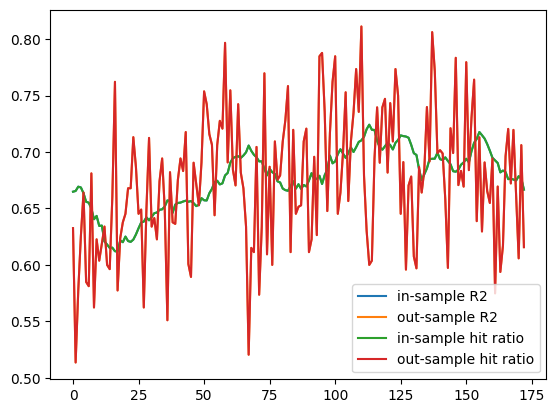

in-sample R2:  0.676792664203364
out-sample R2:  0.6747990932565078
in-sample RMSE:  1.1360720373402682
out-sample RMSE:  1.1357547658981093
in-sample hit ratio:  0.676792664203364
out-sample hit ratio:  0.6747990932565078

LOGISTIC_20_80%



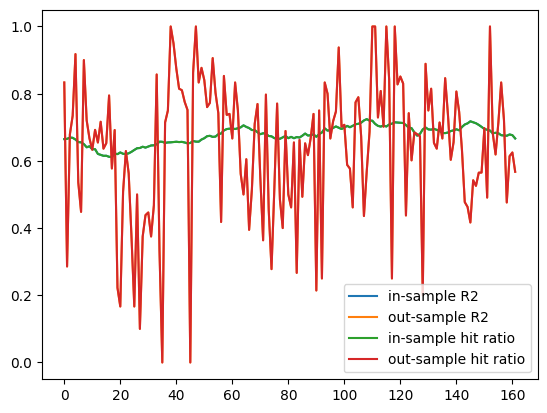

in-sample R2:  0.6765030715624973
out-sample R2:  0.6400842339861154
in-sample RMSE:  1.1365612533491456
out-sample RMSE:  1.135445702539919
in-sample hit ratio:  0.6765030715624973
out-sample hit ratio:  0.6400842339861154


In [37]:
for future_name in trading_pairs.keys():
  data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Independent project_2023 Summer/FactorData/AllFactors/' + future_name +'.csv',index_col=0, parse_dates=True)
  print("Model for " + future_name)
  predict_model(data)
  print("======================================================================================")

Model for JBF
OLS_5_ALL_CASES



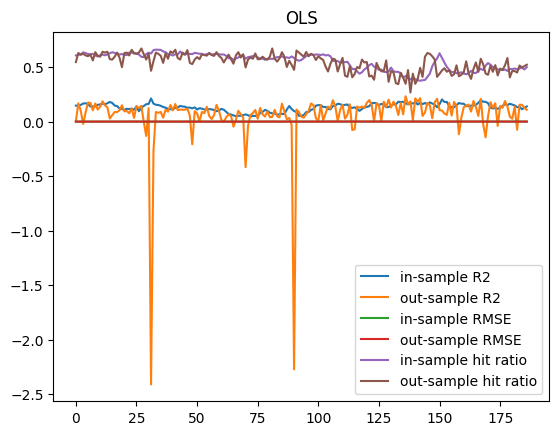

in-sample R2:  0.1315702317821529
out-sample R2:  0.06222414884287497
in-sample RMSE:  0.0009215568672724685
out-sample RMSE:  0.0009429925574253139
in-sample hit ratio:  0.5528810970253767
out-sample hit ratio:  0.5420001795386167

OLS_20_ALL_CASES



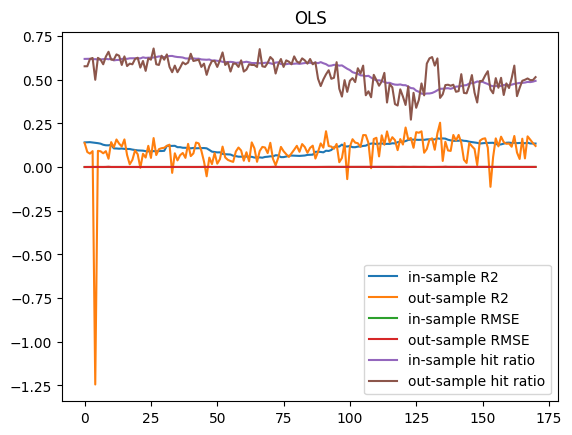

in-sample R2:  0.11287250667645761
out-sample R2:  0.09599234380660197
in-sample RMSE:  0.0009501007204480421
out-sample RMSE:  0.0009466648088805992
in-sample hit ratio:  0.5528348816268465
out-sample hit ratio:  0.5383777911187047

LOGISTIC_5_ALL_CASES



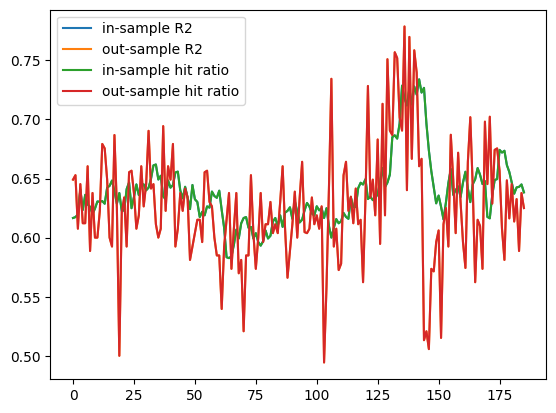

in-sample R2:  0.6374792404678523
out-sample R2:  0.6268707701970971
in-sample RMSE:  1.203213592518912
out-sample RMSE:  1.218968699228737
in-sample hit ratio:  0.6374792404678523
out-sample hit ratio:  0.6268707701970971

LOGISTIC_5_80%



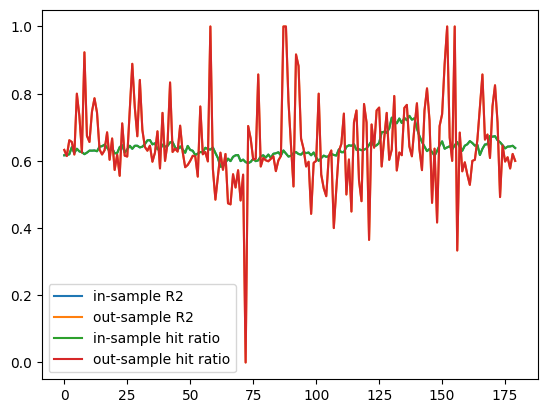

in-sample R2:  0.6383660641182652
out-sample R2:  0.6475006275181104
in-sample RMSE:  1.2017408603623443
out-sample RMSE:  1.1556858479652659
in-sample hit ratio:  0.6383660641182652
out-sample hit ratio:  0.6475006275181104

LOGISTIC_20_ALL_CASES



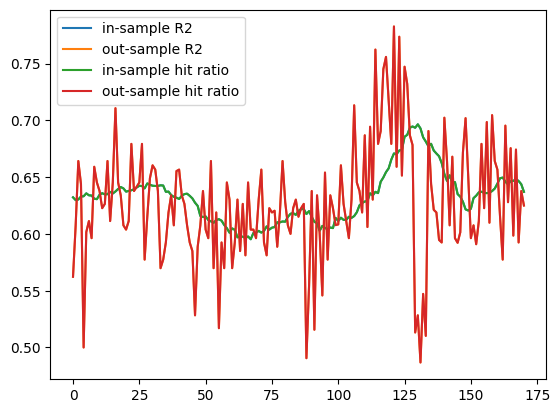

in-sample R2:  0.6325954480740853
out-sample R2:  0.6271428701560312
in-sample RMSE:  1.2116749196129686
out-sample RMSE:  1.2182534484406293
in-sample hit ratio:  0.6325954480740853
out-sample hit ratio:  0.6271428701560312

LOGISTIC_20_80%



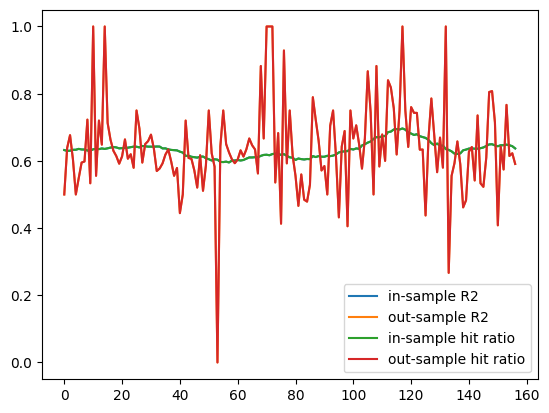

in-sample R2:  0.6337399625032424
out-sample R2:  0.6403815347516127
in-sample RMSE:  1.209770646725298
out-sample RMSE:  1.1585335225282354
in-sample hit ratio:  0.6337399625032424
out-sample hit ratio:  0.6403815347516127
Model for QWF
OLS_5_ALL_CASES



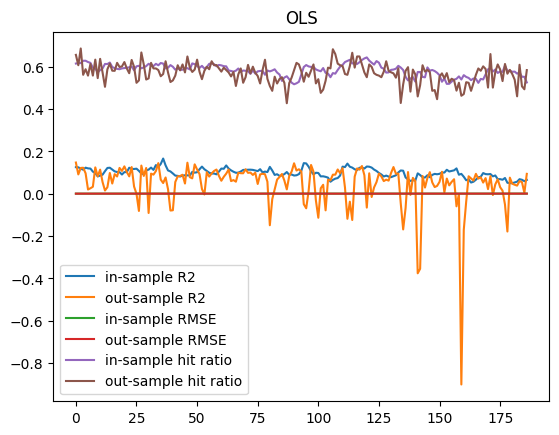

in-sample R2:  0.09856624066439262
out-sample R2:  0.04613807407594907
in-sample RMSE:  0.0006850781976661507
out-sample RMSE:  0.0007028863176726495
in-sample hit ratio:  0.5843025274631882
out-sample hit ratio:  0.5696516428498254

OLS_20_ALL_CASES



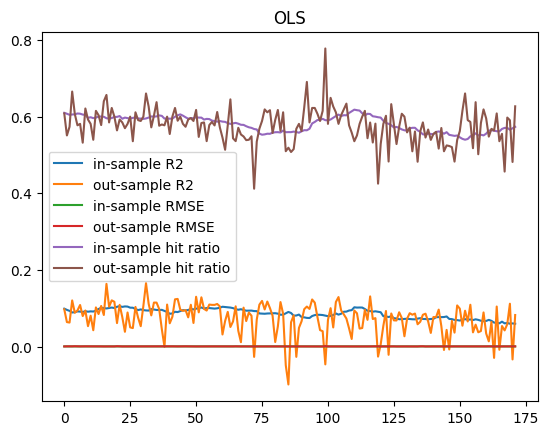

in-sample R2:  0.08644952508646168
out-sample R2:  0.07263437441113789
in-sample RMSE:  0.0006936640855273781
out-sample RMSE:  0.0006952180045924954
in-sample hit ratio:  0.581572537146935
out-sample hit ratio:  0.5768636688984183

LOGISTIC_5_ALL_CASES



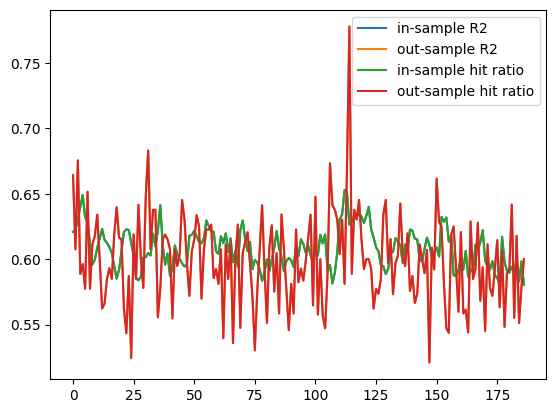

in-sample R2:  0.6081298106559213
out-sample R2:  0.5994093163859178
in-sample RMSE:  1.2517614237210846
out-sample RMSE:  1.264650858107834
in-sample hit ratio:  0.6081298106559213
out-sample hit ratio:  0.5994093163859178

LOGISTIC_5_80%



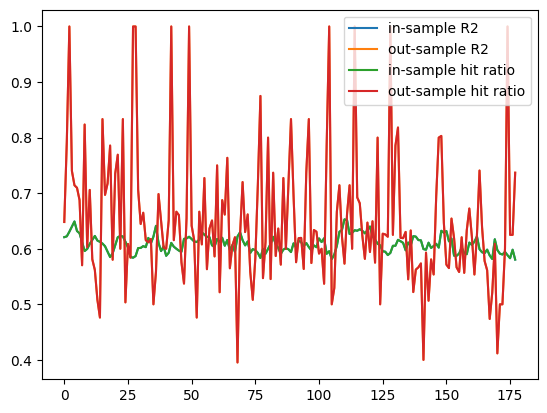

in-sample R2:  0.6086423502856807
out-sample R2:  0.6491842065470246
in-sample RMSE:  1.2509412796374286
out-sample RMSE:  1.1447695512654608
in-sample hit ratio:  0.6086423502856807
out-sample hit ratio:  0.6491842065470246

LOGISTIC_20_ALL_CASES



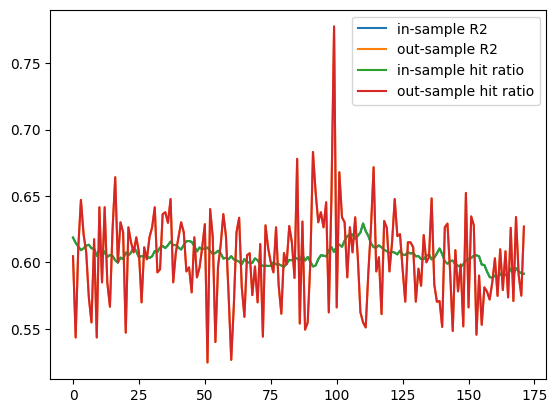

in-sample R2:  0.6052828552002703
out-sample R2:  0.603213531914714
in-sample RMSE:  1.256474908942147
out-sample RMSE:  1.2585959163814513
in-sample hit ratio:  0.6052828552002703
out-sample hit ratio:  0.603213531914714

LOGISTIC_20_80%



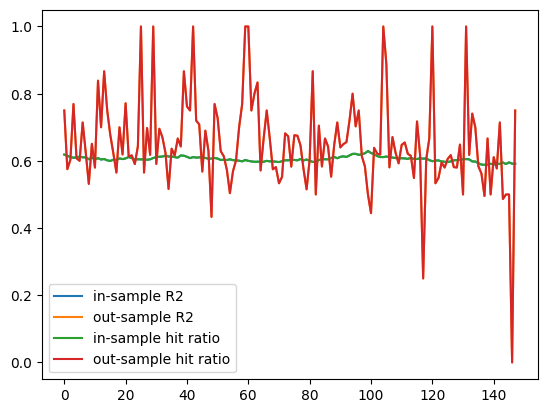

in-sample R2:  0.6052934071417037
out-sample R2:  0.6522725064455215
in-sample RMSE:  1.256456068252249
out-sample RMSE:  1.1348068883629225
in-sample hit ratio:  0.6052934071417037
out-sample hit ratio:  0.6522725064455215
Model for HCF
OLS_5_ALL_CASES



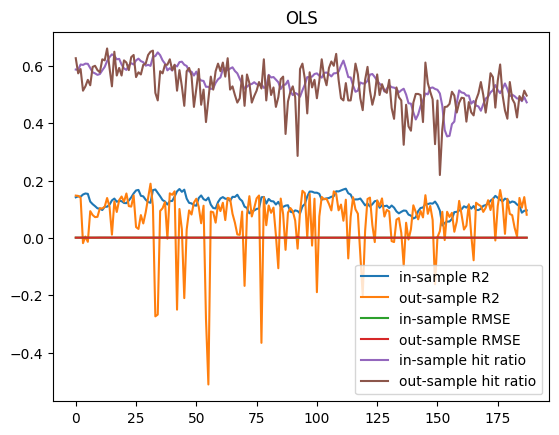

in-sample R2:  0.12215966299535093
out-sample R2:  0.06293553658744924
in-sample RMSE:  0.000644790051450737
out-sample RMSE:  0.0006706866017484636
in-sample hit ratio:  0.5433191712379162
out-sample hit ratio:  0.5242895630677389

OLS_20_ALL_CASES



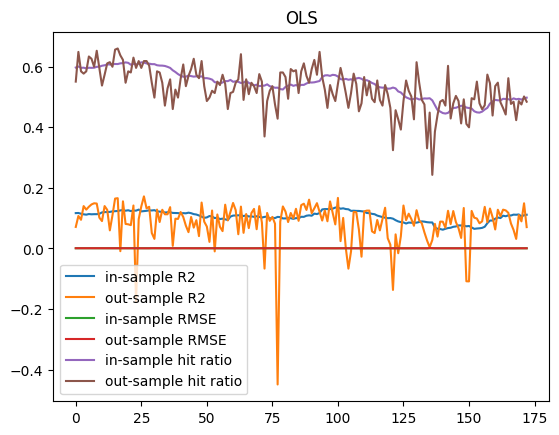

in-sample R2:  0.10544392986496205
out-sample R2:  0.08581732225581111
in-sample RMSE:  0.0006520483743713188
out-sample RMSE:  0.0006409506807707597
in-sample hit ratio:  0.541938330998852
out-sample hit ratio:  0.5291386277851763

LOGISTIC_5_ALL_CASES



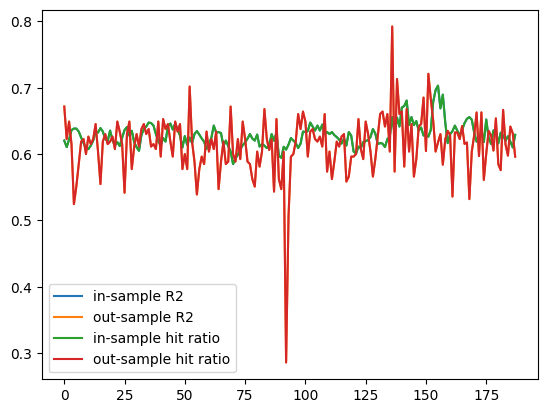

in-sample R2:  0.6284585703186816
out-sample R2:  0.6140802173734679
in-sample RMSE:  1.2187318169235715
out-sample RMSE:  1.2404863289749997
in-sample hit ratio:  0.6284585703186816
out-sample hit ratio:  0.6140802173734679

LOGISTIC_5_80%



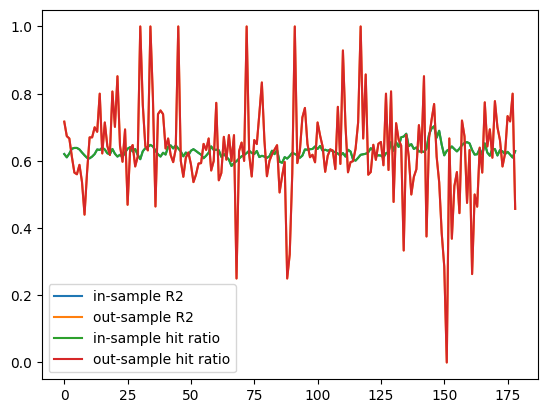

in-sample R2:  0.6282467359311912
out-sample R2:  0.6314154489091041
in-sample RMSE:  1.2190792903179524
out-sample RMSE:  1.1792470421406085
in-sample hit ratio:  0.6282467359311912
out-sample hit ratio:  0.6314154489091041

LOGISTIC_20_ALL_CASES



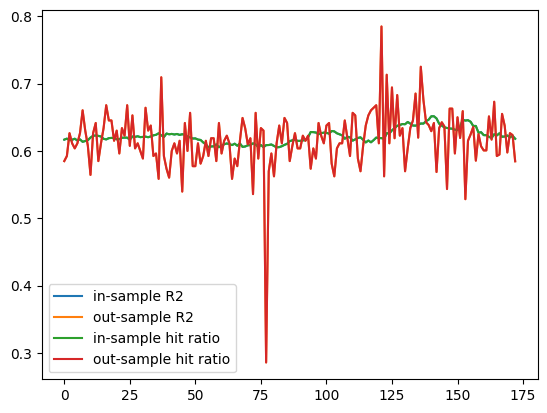

in-sample R2:  0.6219989677683517
out-sample R2:  0.6167007480391812
in-sample RMSE:  1.2295139972220528
out-sample RMSE:  1.2363250045725485
in-sample hit ratio:  0.6219989677683517
out-sample hit ratio:  0.6167007480391812

LOGISTIC_20_80%



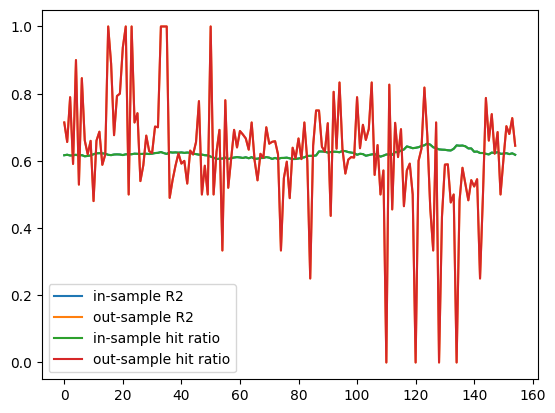

in-sample R2:  0.6213722323318372
out-sample R2:  0.6241270308888235
in-sample RMSE:  1.2305409277013515
out-sample RMSE:  1.1772580961685988
in-sample hit ratio:  0.6213722323318372
out-sample hit ratio:  0.6241270308888235
Model for DBF
OLS_5_ALL_CASES



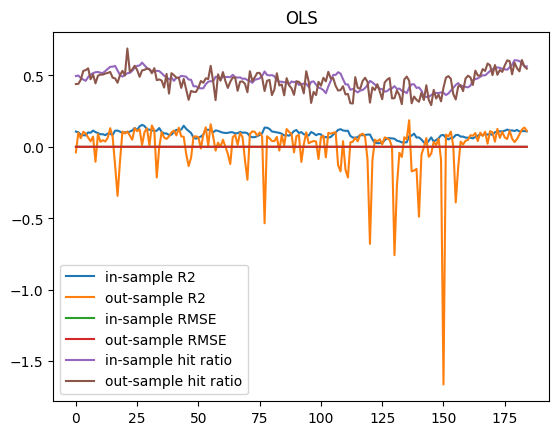

in-sample R2:  0.08937200201809097
out-sample R2:  0.008064190145666457
in-sample RMSE:  0.0007937342628665675
out-sample RMSE:  0.0008141533751148508
in-sample hit ratio:  0.46945029008809136
out-sample hit ratio:  0.45626346517582644

OLS_20_ALL_CASES



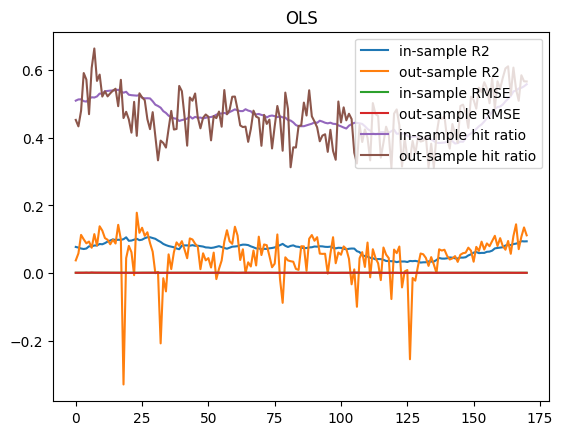

in-sample R2:  0.07053368871127721
out-sample R2:  0.05308224049999883
in-sample RMSE:  0.000808233869202868
out-sample RMSE:  0.0007892893993311098
in-sample hit ratio:  0.46106504685026367
out-sample hit ratio:  0.4592797352292109

LOGISTIC_5_ALL_CASES



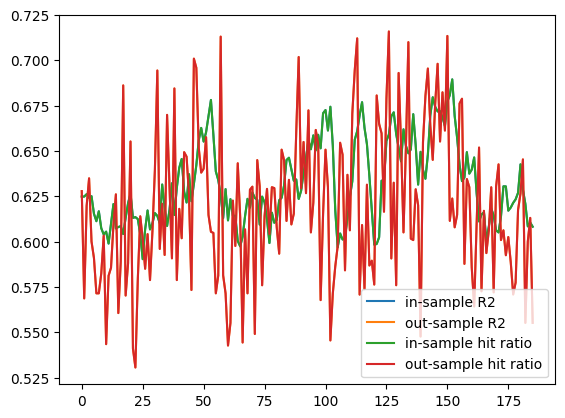

in-sample R2:  0.6317632227436893
out-sample R2:  0.6188880407842164
in-sample RMSE:  1.2130671159358126
out-sample RMSE:  1.2328496606112067
in-sample hit ratio:  0.6317632227436893
out-sample hit ratio:  0.6188880407842164

LOGISTIC_5_80%



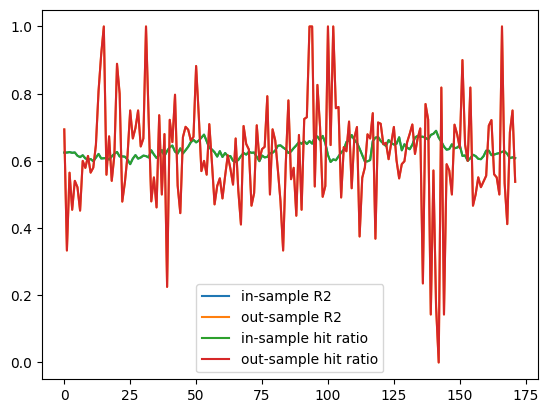

in-sample R2:  0.6314764087866608
out-sample R2:  0.6176149824759993
in-sample RMSE:  1.213538789177293
out-sample RMSE:  1.1925608071099678
in-sample hit ratio:  0.6314764087866608
out-sample hit ratio:  0.6176149824759993

LOGISTIC_20_ALL_CASES



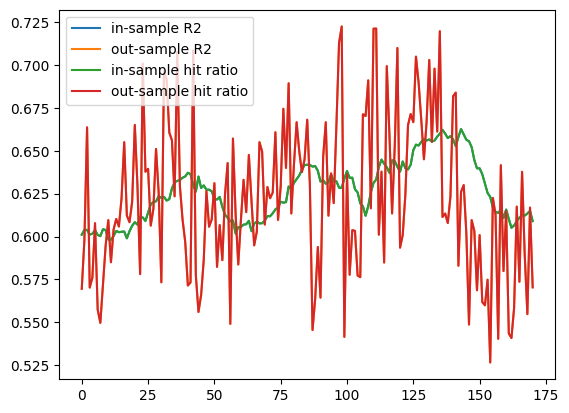

in-sample R2:  0.6260526341955912
out-sample R2:  0.6221666344936789
in-sample RMSE:  1.222686595486704
out-sample RMSE:  1.2271857283327827
in-sample hit ratio:  0.6260526341955912
out-sample hit ratio:  0.6221666344936789

LOGISTIC_20_80%



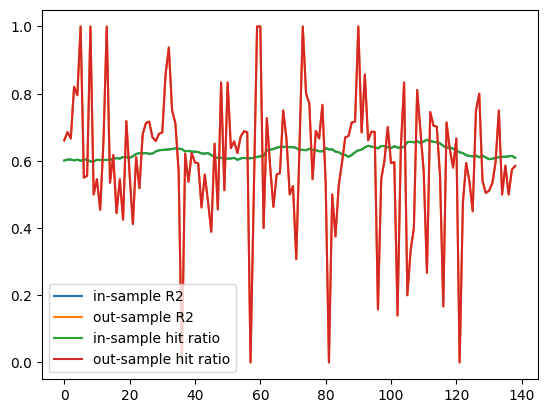

in-sample R2:  0.6248094294463109
out-sample R2:  0.6019465354032215
in-sample RMSE:  1.2247687294797283
out-sample RMSE:  1.2047110679052968
in-sample hit ratio:  0.6248094294463109
out-sample hit ratio:  0.6019465354032215
Model for EHF
OLS_5_ALL_CASES



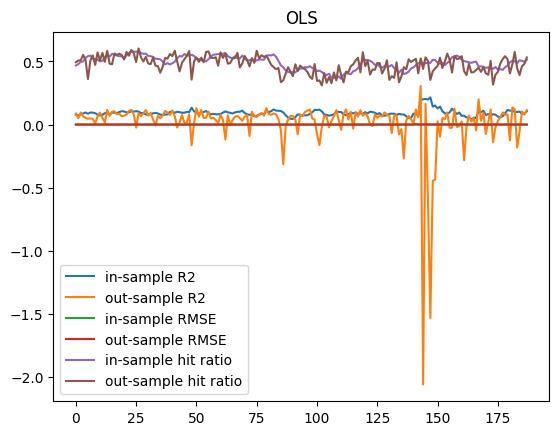

in-sample R2:  0.09252282438591085
out-sample R2:  0.015944251656356545
in-sample RMSE:  0.000670917422994074
out-sample RMSE:  0.0006710385654410674
in-sample hit ratio:  0.49177912702715204
out-sample hit ratio:  0.47599918057496887

OLS_20_ALL_CASES



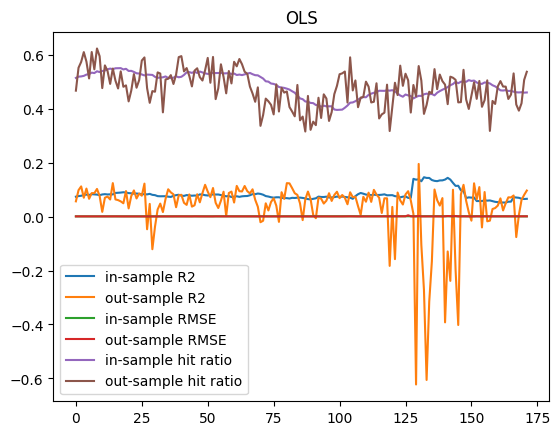

in-sample R2:  0.0811898497453747
out-sample R2:  0.03496757112693528
in-sample RMSE:  0.0006990765878625431
out-sample RMSE:  0.0006594299943374602
in-sample hit ratio:  0.48772350184322044
out-sample hit ratio:  0.47690640940217716

LOGISTIC_5_ALL_CASES



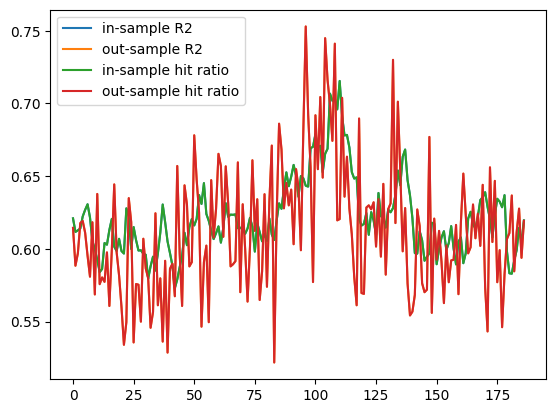

in-sample R2:  0.621781603297723
out-sample R2:  0.6123522419150464
in-sample RMSE:  1.2292115246660318
out-sample RMSE:  1.2431570326201866
in-sample hit ratio:  0.621781603297723
out-sample hit ratio:  0.6123522419150464

LOGISTIC_5_80%



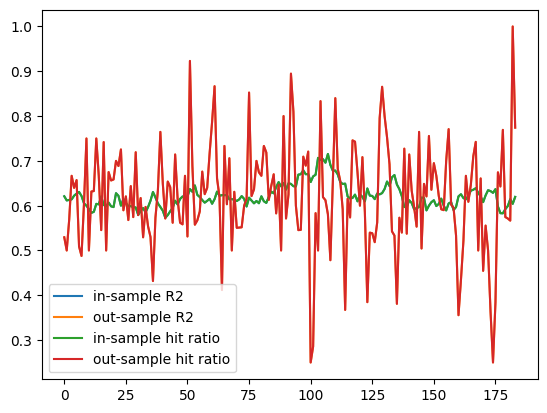

in-sample R2:  0.6214819248263506
out-sample R2:  0.6204656298146667
in-sample RMSE:  1.22969922473785
out-sample RMSE:  1.2142948600660766
in-sample hit ratio:  0.6214819248263506
out-sample hit ratio:  0.6204656298146667

LOGISTIC_20_ALL_CASES



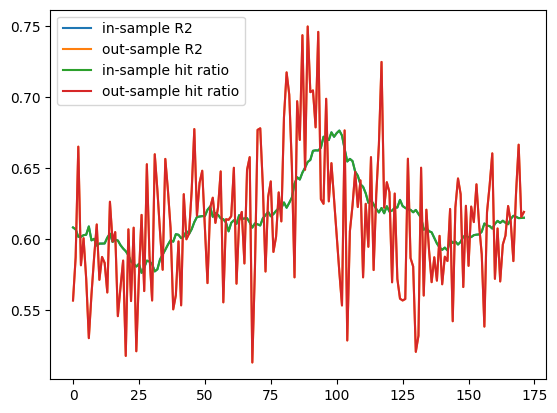

in-sample R2:  0.6154536707411491
out-sample R2:  0.6116795858226013
in-sample RMSE:  1.2397038627380794
out-sample RMSE:  1.2440421914024087
in-sample hit ratio:  0.6154536707411491
out-sample hit ratio:  0.6116795858226013

LOGISTIC_20_80%



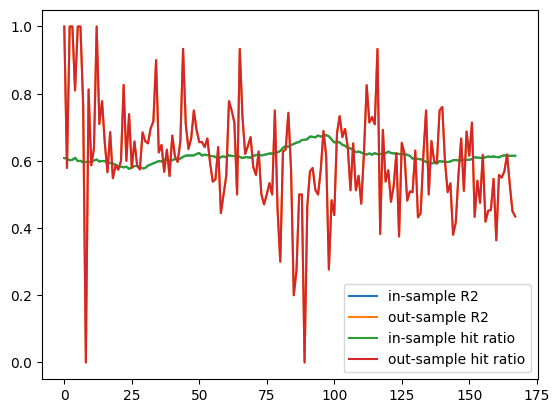

in-sample R2:  0.6152666444438939
out-sample R2:  0.6047024006225296
in-sample RMSE:  1.2400104606814817
out-sample RMSE:  1.2157733090389624
in-sample hit ratio:  0.6152666444438939
out-sample hit ratio:  0.6047024006225296
Model for IPF
OLS_5_ALL_CASES



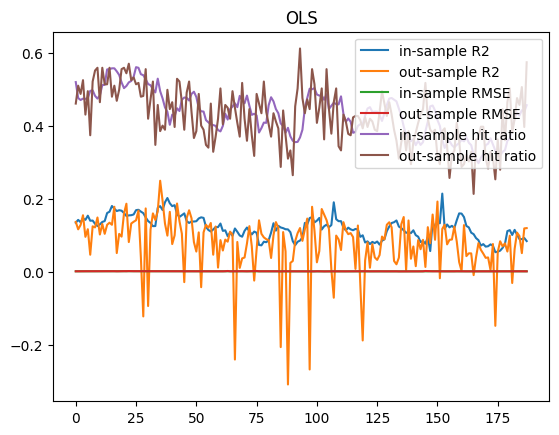

in-sample R2:  0.12124841516231048
out-sample R2:  0.07753591392965399
in-sample RMSE:  0.0009250003566372199
out-sample RMSE:  0.0009392501085159079
in-sample hit ratio:  0.4326865598648812
out-sample hit ratio:  0.42332436010198005

OLS_20_ALL_CASES



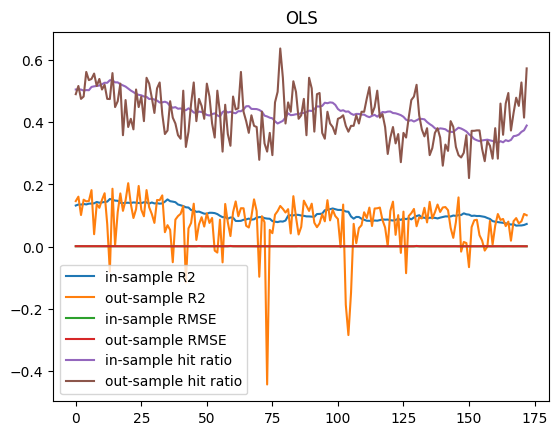

in-sample R2:  0.10572867301031297
out-sample R2:  0.07882948631196623
in-sample RMSE:  0.0009374170230673609
out-sample RMSE:  0.0009221586950974657
in-sample hit ratio:  0.42974290864205705
out-sample hit ratio:  0.41935169027859326

LOGISTIC_5_ALL_CASES



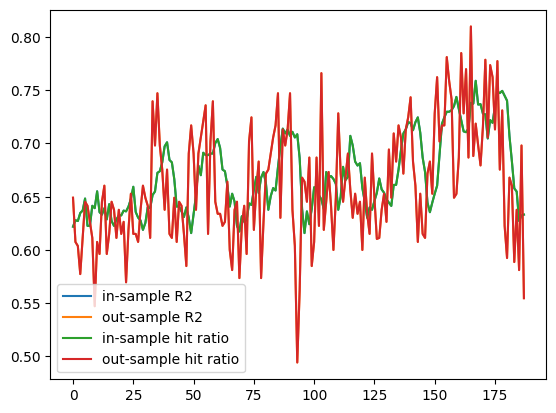

in-sample R2:  0.6702319045680623
out-sample R2:  0.6607554481348005
in-sample RMSE:  1.1466715444804718
out-sample RMSE:  1.1610713404346025
in-sample hit ratio:  0.6702319045680623
out-sample hit ratio:  0.6607554481348005

LOGISTIC_5_80%



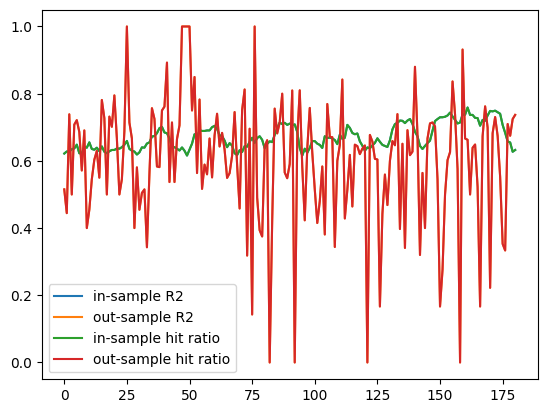

in-sample R2:  0.6707389615196897
out-sample R2:  0.6011145167858946
in-sample RMSE:  1.1457620082878015
out-sample RMSE:  1.2171087503693818
in-sample hit ratio:  0.6707389615196897
out-sample hit ratio:  0.6011145167858946

LOGISTIC_20_ALL_CASES



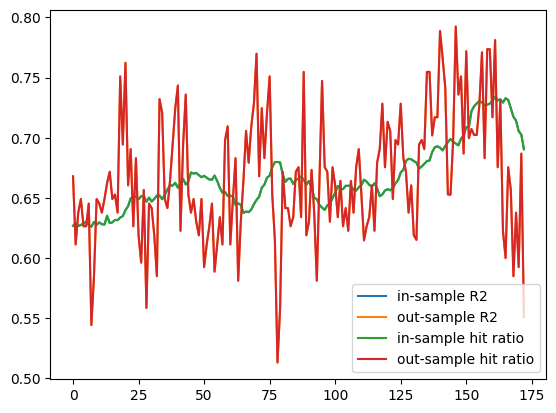

in-sample R2:  0.6669684021038953
out-sample R2:  0.6674859269578107
in-sample RMSE:  1.1531373434205883
out-sample RMSE:  1.1495394432487283
in-sample hit ratio:  0.6669684021038953
out-sample hit ratio:  0.6674859269578107

LOGISTIC_20_80%



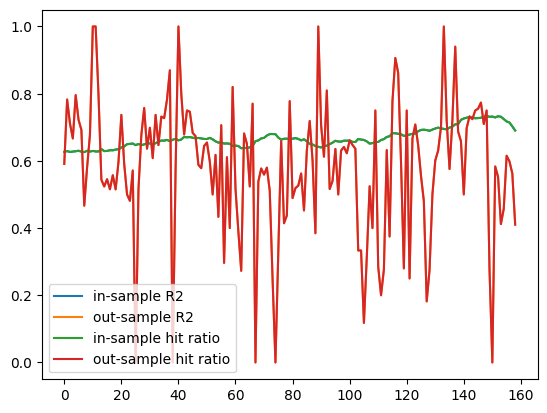

in-sample R2:  0.6674964215104228
out-sample R2:  0.5815088549697616
in-sample RMSE:  1.152159884540575
out-sample RMSE:  1.2449120049214113
in-sample hit ratio:  0.6674964215104228
out-sample hit ratio:  0.5815088549697616
Model for IIF
OLS_5_ALL_CASES



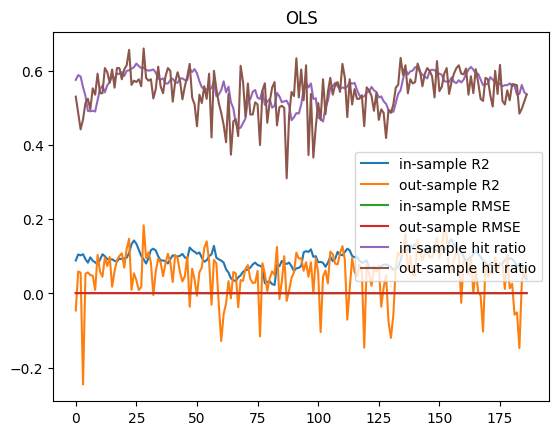

in-sample R2:  0.09128144028444643
out-sample R2:  0.051524960850994436
in-sample RMSE:  0.0006292795858374024
out-sample RMSE:  0.0006377519350518974
in-sample hit ratio:  0.5545678921416345
out-sample hit ratio:  0.5418285895993425

OLS_20_ALL_CASES



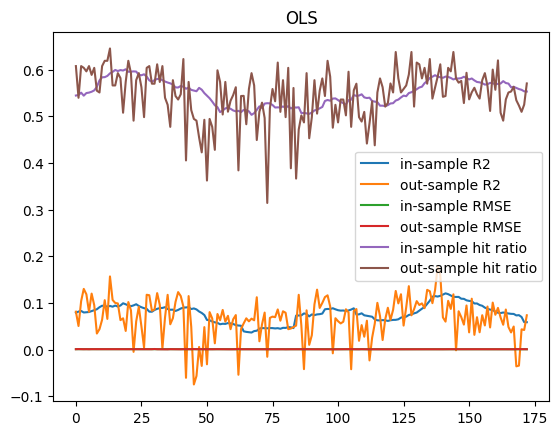

in-sample R2:  0.0781372284856125
out-sample R2:  0.06690216887052297
in-sample RMSE:  0.0006311391234148098
out-sample RMSE:  0.0006201727051843299
in-sample hit ratio:  0.5510185165229579
out-sample hit ratio:  0.5451200285971459

LOGISTIC_5_ALL_CASES



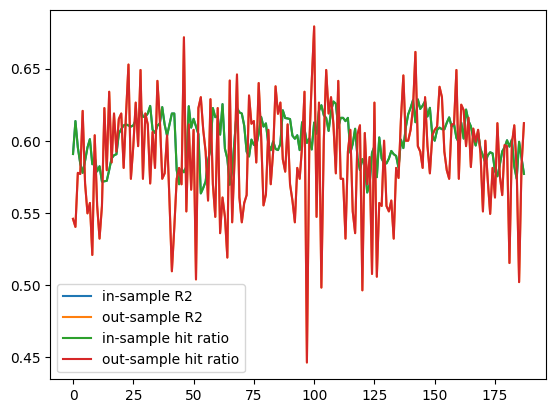

in-sample R2:  0.6010668407542299
out-sample R2:  0.5876227336829271
in-sample RMSE:  1.2629852038274545
out-sample RMSE:  1.2830337876406361
in-sample hit ratio:  0.6010668407542299
out-sample hit ratio:  0.5876227336829271

LOGISTIC_5_80%



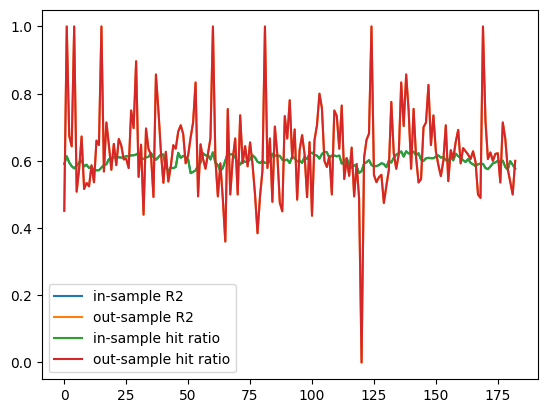

in-sample R2:  0.601158053780949
out-sample R2:  0.6286639610967842
in-sample RMSE:  1.2628423235003772
out-sample RMSE:  1.1842876306649324
in-sample hit ratio:  0.601158053780949
out-sample hit ratio:  0.6286639610967842

LOGISTIC_20_ALL_CASES



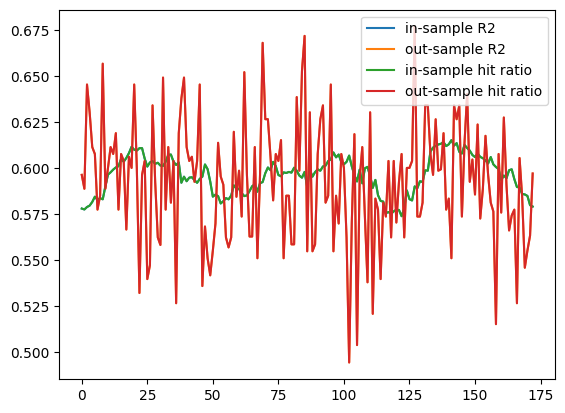

in-sample R2:  0.5961336107775679
out-sample R2:  0.5921101433389713
in-sample RMSE:  1.270910478266743
out-sample RMSE:  1.276286169164744
in-sample hit ratio:  0.5961336107775679
out-sample hit ratio:  0.5921101433389713

LOGISTIC_20_80%



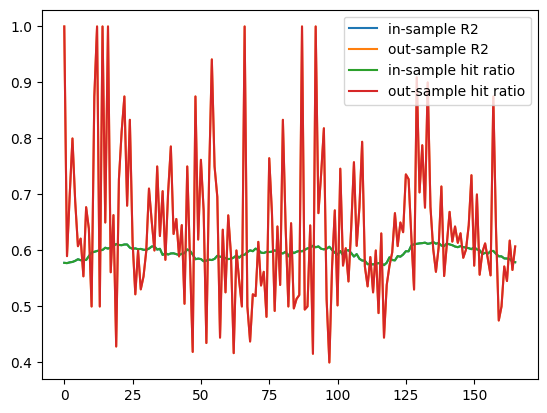

in-sample R2:  0.5960662174550755
out-sample R2:  0.637954765474263
in-sample RMSE:  1.2710132721382061
out-sample RMSE:  1.1627564610762282
in-sample hit ratio:  0.5960662174550755
out-sample hit ratio:  0.637954765474263
Model for QXF
OLS_5_ALL_CASES



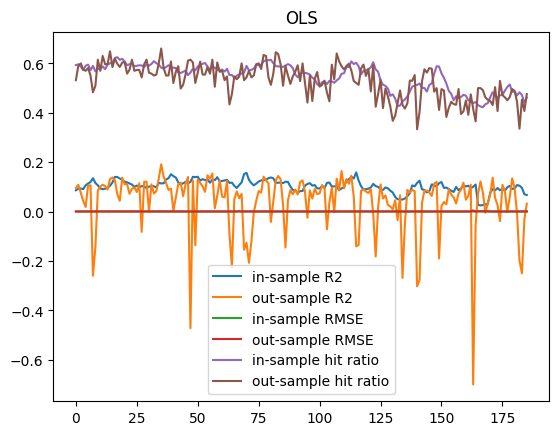

in-sample R2:  0.10485911807950186
out-sample R2:  0.042283040983396164
in-sample RMSE:  0.0006302959319215622
out-sample RMSE:  0.0006267469246548652
in-sample hit ratio:  0.5463362511452295
out-sample hit ratio:  0.5288434269136046

OLS_20_ALL_CASES



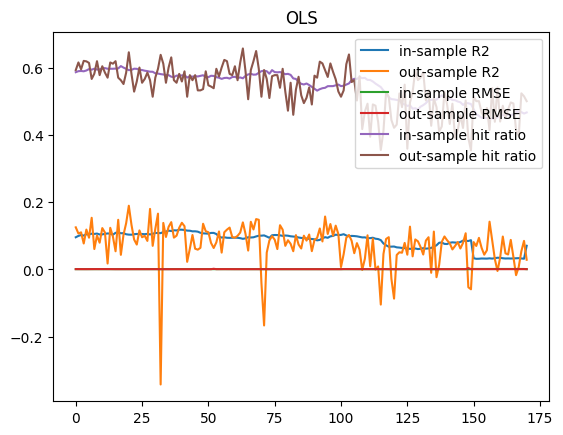

in-sample R2:  0.08714488931461552
out-sample R2:  0.07536225613384685
in-sample RMSE:  0.0006679520534252998
out-sample RMSE:  0.0006086149971899721
in-sample hit ratio:  0.5450359655311908
out-sample hit ratio:  0.53558684597467

LOGISTIC_5_ALL_CASES



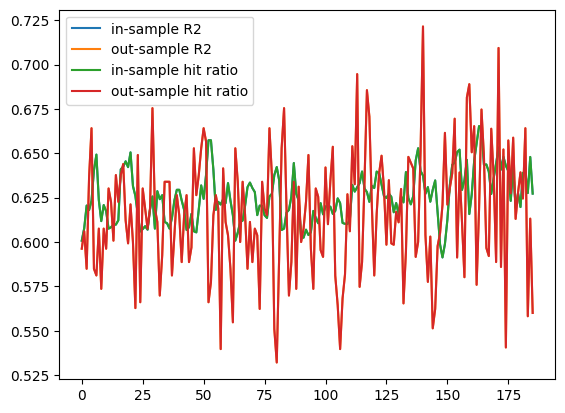

in-sample R2:  0.6254109431248278
out-sample R2:  0.615823210486398
in-sample RMSE:  1.223852719831249
out-sample RMSE:  1.2383959606902577
in-sample hit ratio:  0.6254109431248278
out-sample hit ratio:  0.615823210486398

LOGISTIC_5_80%



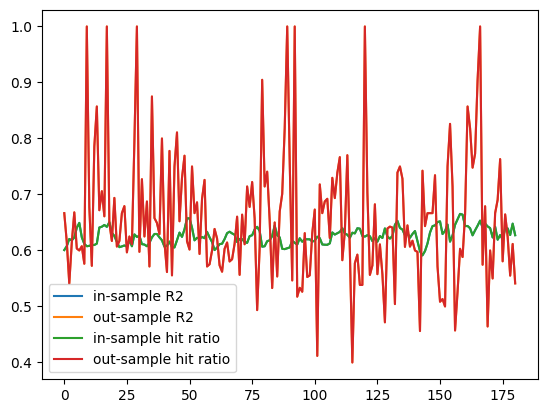

in-sample R2:  0.6255433908410676
out-sample R2:  0.656209184821787
in-sample RMSE:  1.2236330132397366
out-sample RMSE:  1.139050413286253
in-sample hit ratio:  0.6255433908410676
out-sample hit ratio:  0.656209184821787

LOGISTIC_20_ALL_CASES



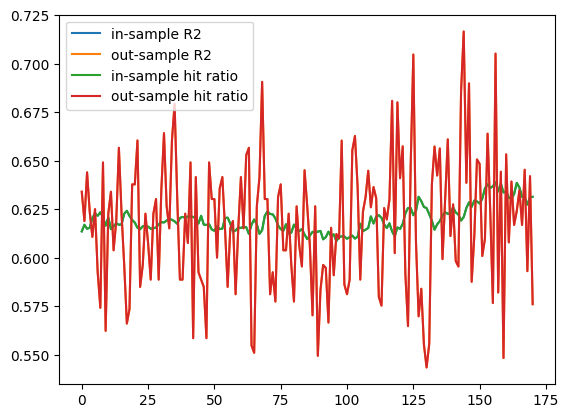

in-sample R2:  0.6196826598585818
out-sample R2:  0.617334030767422
in-sample RMSE:  1.2333465055756707
out-sample RMSE:  1.235980725946037
in-sample hit ratio:  0.6196826598585818
out-sample hit ratio:  0.617334030767422

LOGISTIC_20_80%



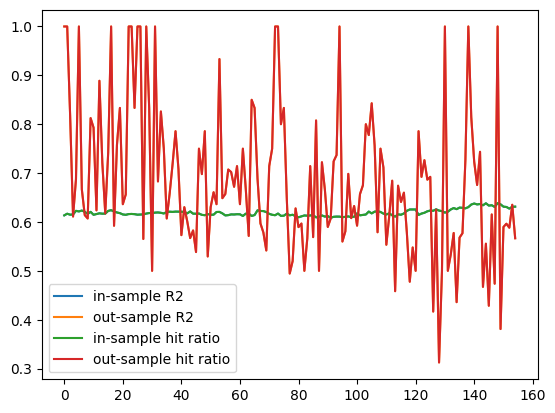

in-sample R2:  0.6191661317360653
out-sample R2:  0.6850291999174579
in-sample RMSE:  1.2341857389748754
out-sample RMSE:  1.048424363110704
in-sample hit ratio:  0.6191661317360653
out-sample hit ratio:  0.6850291999174579
Model for PEF
OLS_5_ALL_CASES



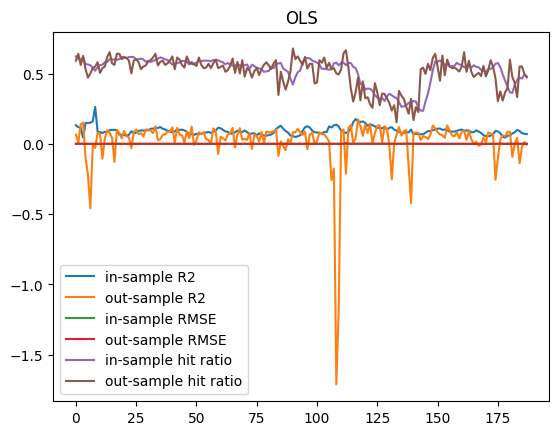

in-sample R2:  0.09345416234942609
out-sample R2:  0.022679656904118876
in-sample RMSE:  0.0007363035760734034
out-sample RMSE:  0.0007689577799637593
in-sample hit ratio:  0.5220524299967628
out-sample hit ratio:  0.5096587137313953

OLS_20_ALL_CASES



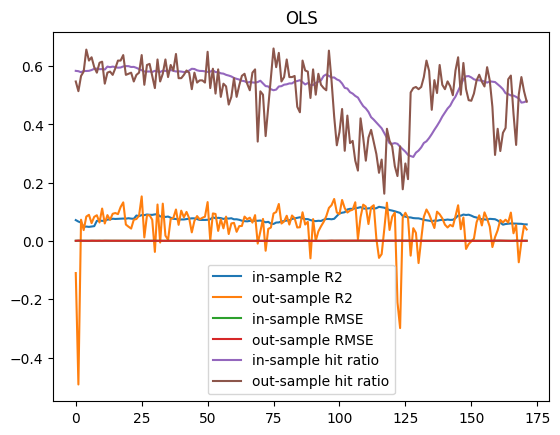

in-sample R2:  0.07836212369899954
out-sample R2:  0.05617093584134103
in-sample RMSE:  0.0007429504888590573
out-sample RMSE:  0.0007295872376500436
in-sample hit ratio:  0.5192442979681574
out-sample hit ratio:  0.506503822675092

LOGISTIC_5_ALL_CASES



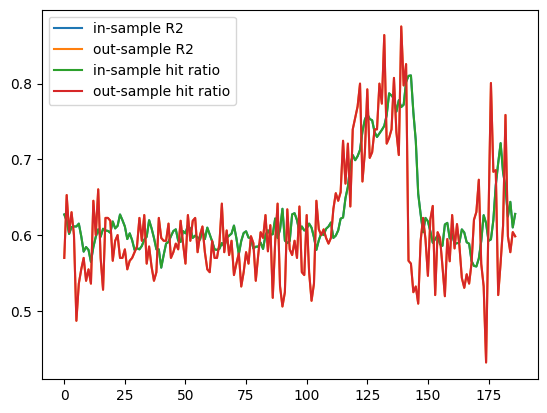

in-sample R2:  0.6258877606626928
out-sample R2:  0.6097959315420293
in-sample RMSE:  1.218909623165761
out-sample RMSE:  1.2425015465360458
in-sample hit ratio:  0.6258877606626928
out-sample hit ratio:  0.6097959315420293

LOGISTIC_5_80%



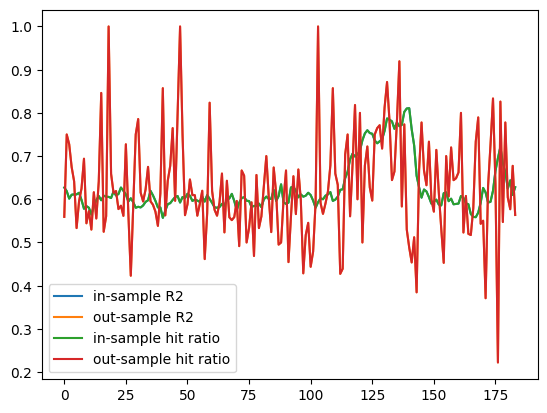

in-sample R2:  0.6255961439630793
out-sample R2:  0.627002064268286
in-sample RMSE:  1.219426384628283
out-sample RMSE:  1.1978990014261675
in-sample hit ratio:  0.6255961439630793
out-sample hit ratio:  0.627002064268286

LOGISTIC_20_ALL_CASES



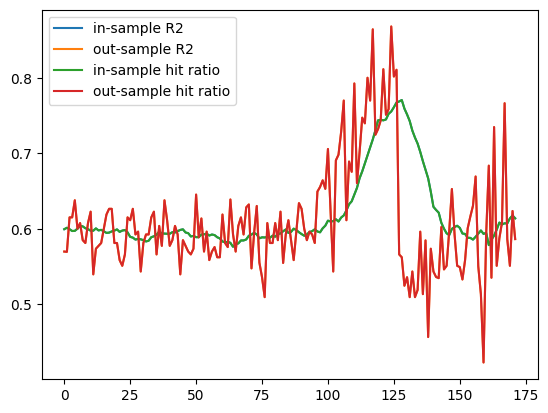

in-sample R2:  0.6176142022424349
out-sample R2:  0.609842727835836
in-sample RMSE:  1.2337151505837363
out-sample RMSE:  1.2427701665279236
in-sample hit ratio:  0.6176142022424349
out-sample hit ratio:  0.609842727835836

LOGISTIC_20_80%



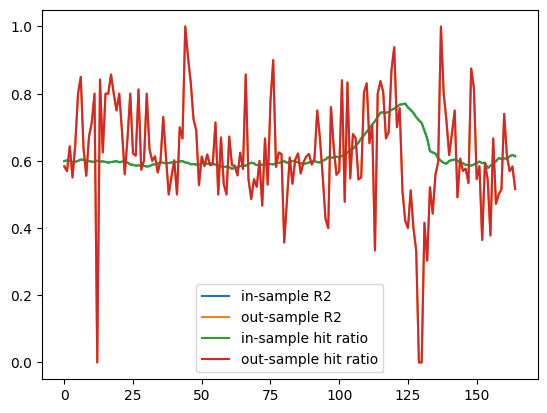

in-sample R2:  0.6171396582315809
out-sample R2:  0.6189354452074616
in-sample RMSE:  1.234452127904004
out-sample RMSE:  1.2019924129058261
in-sample hit ratio:  0.6171396582315809
out-sample hit ratio:  0.6189354452074616
Model for NAF
OLS_5_ALL_CASES



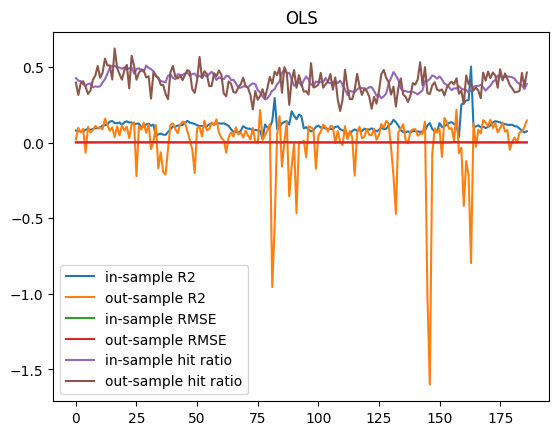

in-sample R2:  0.10934818592858962
out-sample R2:  0.013331441487000325
in-sample RMSE:  0.0010321556770026938
out-sample RMSE:  0.0010461638876645887
in-sample hit ratio:  0.4009748264596261
out-sample hit ratio:  0.39290657460313666

OLS_20_ALL_CASES



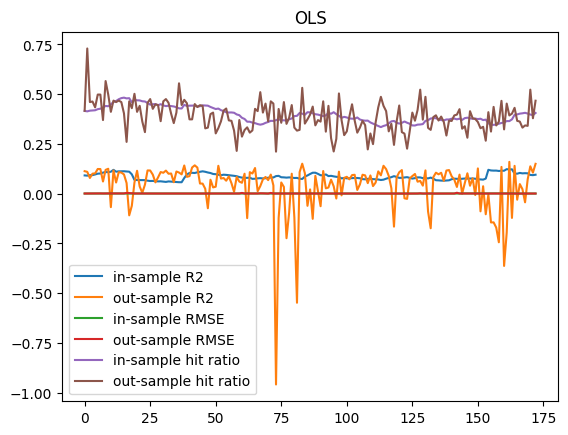

in-sample R2:  0.08609021946951312
out-sample R2:  0.038558306147035926
in-sample RMSE:  0.0011081113915412833
out-sample RMSE:  0.0010201626430142725
in-sample hit ratio:  0.39631029530768674
out-sample hit ratio:  0.3884389977455436

LOGISTIC_5_ALL_CASES



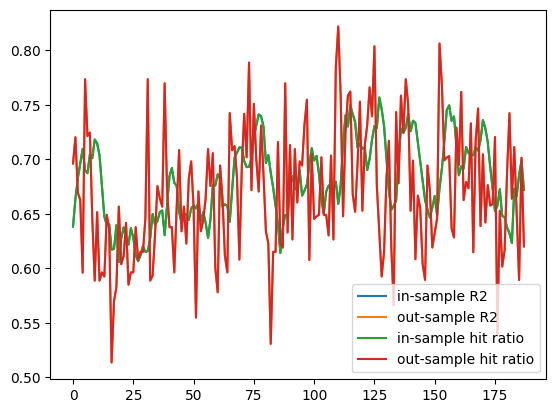

in-sample R2:  0.6797114787271534
out-sample R2:  0.6686444603463627
in-sample RMSE:  1.1300709616037286
out-sample RMSE:  1.146569751185031
in-sample hit ratio:  0.6797114787271534
out-sample hit ratio:  0.6686444603463627

LOGISTIC_5_80%



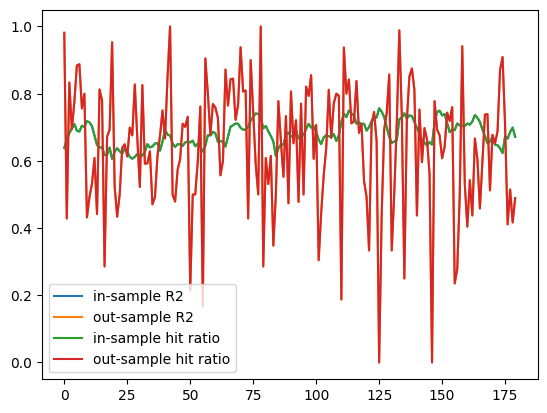

in-sample R2:  0.6798308860422742
out-sample R2:  0.6437087815621513
in-sample RMSE:  1.1298330307537252
out-sample RMSE:  1.1461151548281059
in-sample hit ratio:  0.6798308860422742
out-sample hit ratio:  0.6437087815621513

LOGISTIC_20_ALL_CASES



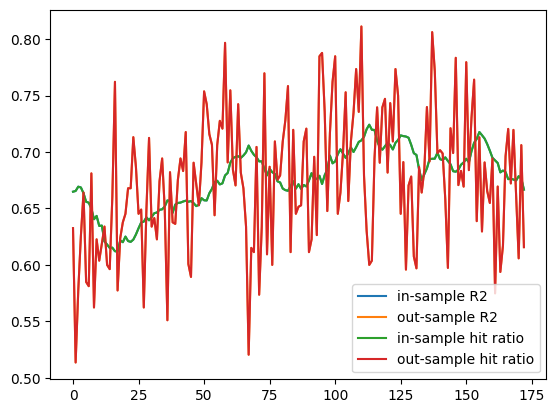

in-sample R2:  0.676792664203364
out-sample R2:  0.6747990932565078
in-sample RMSE:  1.1360720373402682
out-sample RMSE:  1.1357547658981093
in-sample hit ratio:  0.676792664203364
out-sample hit ratio:  0.6747990932565078

LOGISTIC_20_80%



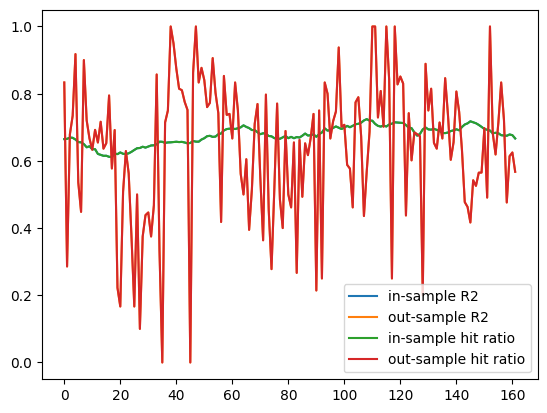

in-sample R2:  0.6765030715624973
out-sample R2:  0.6400842339861154
in-sample RMSE:  1.1365612533491456
out-sample RMSE:  1.135445702539919
in-sample hit ratio:  0.6765030715624973
out-sample hit ratio:  0.6400842339861154


In [39]:
for future_name in trading_pairs.keys():
  data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Independent project_2023 Summer/FactorData/AllFactors/' + future_name +'.csv',index_col=0, parse_dates=True)
  print("Model for " + future_name)
  predict_model(data)
  print("======================================================================================")